<a href="https://colab.research.google.com/github/EduardoAve/Labour-well-being/blob/main/data_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Exploratory Data Analysis (EDA): Academic Labour Well-being (Austria & Czech Rep.)

This notebook performs a detailed exploratory analysis of the labour well-being dataset for academic staff in Austria and the Czech Republic. The objectives are:
1.  **Clean and preprocess** the data (handling missing values with mode imputation, encoding categorical labels).
2.  Perform **univariate analysis** to understand the distribution of each variable.
3.  Perform **bivariate and multivariate analysis** to explore relationships between variables (correlations, scatter plots, comparative plots).
4.  Investigate **disparities and biases** through grouped statistics and comparative visualizations by country, gender, age, institution type, and field of study.

The analysis focuses on exploration and description, preparing the ground for future statistical models.

## 1. Initial Setup: Importing Libraries

In [30]:
# Data Manipulation
import pandas as pd
import numpy as np

# Data Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde

# Preprocessing (Only Mode Imputation needed now)
# from sklearn.impute import KNNImputer # Removed as per request

# Visualization Utilities and Warnings
from IPython.display import display, Markdown
import warnings
warnings.filterwarnings('ignore') # Suppress warnings for cleaner output

# Visualization Settings
sns.set_theme(style="whitegrid")
plt.rcParams['figure.figsize'] = (12, 6)

## 2. Data Loading

In [31]:
# Load the dataset from the CSV file
try:
    df_raw = pd.read_csv('/content/drive/MyDrive/labour well being/EDA/labour_well_being_data.csv')
    print("Data loaded successfully.")
    display(df_raw.head())
except FileNotFoundError:
    print("Error: File 'labour_well_being_data.csv' not found. Please check the path.")
    df_raw = pd.DataFrame() # Create an empty DataFrame to avoid subsequent errors

Data loaded successfully.


,Country,Version,Gender,Age,Marital_Status,Care_Responsibilities,HEI_Type,Faculty_Subject_Area,Employment_Contract_Duration,HEI_Employment_Hours,...,Sense_of_Community,Job_Satisfaction,Burnout,Amotivation,Extrinsic_Social,Extrinsic_Material,Introjected,Identified,Intrinsic,Current_Position
0,2,4,2.0,28.0,3.0,1.0,1.0,1.0,2.0,40.0,...,2.666667,2.2,4.0,1.333333,2.0,1.333333,3.25,6.333333,6.333333,3.0
1,2,4,1.0,33.0,2.0,1.0,1.0,3.0,3.0,40.0,...,1.666667,2.4,4.0,2.666667,3.0,3.666667,5.50,6.333333,5.000000,3.0
2,2,4,1.0,39.0,2.0,2.0,1.0,5.0,2.0,40.0,...,3.000000,2.6,4.5,1.000000,1.0,3.666667,6.00,6.333333,5.333333,4.0
3,2,4,2.0,39.0,3.0,1.0,1.0,8.0,2.0,40.0,...,5.000000,2.8,5.0,1.333333,1.0,1.333333,5.25,7.000000,7.000000,4.0
4,2,4,2.0,44.0,2.0,2.0,1.0,5.0,1.0,40.0,...,4.666667,3.6,3.0,1.666667,4.0,4.333333,4.00,5.666667,5.666667,4.0


In [32]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 3. Initial Data Exploration

In [33]:
if not df_raw.empty:
    print(f"DataFrame Dimensions: {df_raw.shape}")
    print("\nGeneral Information and Data Types:")
    df_raw.info()

    print("\nSummary of Missing Values:")
    missing_values = df_raw.isnull().sum()
    missing_percentage = (missing_values / len(df_raw)) * 100
    missing_info = pd.DataFrame({'Count': missing_values, 'Percentage': missing_percentage})
    display(missing_info[missing_info['Count'] > 0].sort_values(by='Count', ascending=False))

    print("\nInitial Descriptive Statistics (Numerical Variables):")
    # Select only numeric columns for describe(), excluding potential IDs like 'Version'
    numeric_cols_initial = df_raw.select_dtypes(include=np.number).columns.difference(['Version'])
    display(df_raw[numeric_cols_initial].describe())
else:
    print("Empty DataFrame, initial exploration skipped.")

DataFrame Dimensions: (2240, 43)

General Information and Data Types:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 43 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       2240 non-null   int64  
 1   Version                       2240 non-null   int64  
 2   Gender                        2240 non-null   float64
 3   Age                           2240 non-null   float64
 4   Marital_Status                2240 non-null   float64
 5   Care_Responsibilities         2240 non-null   float64
 6   HEI_Type                      2240 non-null   float64
 7   Faculty_Subject_Area          2240 non-null   float64
 8   Employment_Contract_Duration  2240 non-null   float64
 9   HEI_Employment_Hours          2240 non-null   float64
 10  HEI_Actual_Weekly_Hours       2240 non-null   float64
 11  Effort_Level                  2240 non-null   float

,Count,Percentage
Job_Category,1762,78.660714
Highest_Education_Level,1762,78.660714
Career_Length_CZ,1762,78.660714
Teaching_Hours,478,21.339286
Research_Hours,478,21.339286
Funded_Research_Activities,478,21.339286
Administrative_Activities,478,21.339286



Initial Descriptive Statistics (Numerical Variables):


,Academic_or_Non_Academic,Academic_resources,Administrative_Activities,Age,Amotivation,Burnout,Care_Responsibilities,Career_Length_CZ,Country,Current_Position,...,Other_Paid_Job,Perceived_Autonomy,Performance_Pressure,Policy_Influence,Quality_of_Leadership,Research_Hours,Salary_Effort_per_Hour,Salary_per_Hour,Sense_of_Community,Teaching_Hours
count,2240.000000,2240.000000,1762.000000,2240.000000,2240.000000,2240.000000,2240.000000,478.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,1762.000000,2240.000000,2240.000000,2240.000000,1762.000000
mean,1.786607,3.330890,6.939359,42.104464,2.184896,4.148549,1.505804,9.512134,1.576339,5.199554,...,2.075446,3.208229,3.622054,2.241518,3.250610,14.482236,62.690914,70.383384,3.940551,15.019750
std,0.409794,0.708308,7.064473,10.660520,1.146756,1.244823,0.645846,8.042281,0.494248,3.381755,...,1.780527,0.858782,1.065248,1.171787,1.145858,11.190957,32.647285,36.758512,0.936617,12.770841
min,1.000000,1.000000,0.000000,18.000000,1.000000,1.000000,1.000000,0.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.036927,0.046159,1.000000,0.000000
25%,2.000000,2.833333,2.000000,33.000000,1.250000,3.250000,1.000000,3.000000,1.000000,2.000000,...,1.000000,2.500000,3.000000,1.000000,2.250000,5.000000,40.389102,46.158974,3.333333,6.000000
50%,2.000000,3.333333,5.000000,41.000000,2.000000,4.000000,1.000000,6.500000,2.000000,4.000000,...,1.000000,3.333333,4.000000,2.000000,3.250000,10.000000,55.390768,61.432571,4.000000,15.000000
75%,2.000000,3.833333,10.000000,49.000000,3.000000,5.000000,2.000000,14.000000,2.000000,8.000000,...,3.000000,3.833333,4.000000,3.000000,4.250000,20.000000,79.866634,88.400000,4.666667,20.000000
max,2.000000,5.000000,80.000000,77.000000,6.666667,7.000000,4.000000,40.000000,2.000000,13.000000,...,7.000000,5.000000,5.000000,5.000000,5.000000,75.000000,438.510248,486.200000,5.000000,275.000000


## 4. Data Preprocessing

In this section, we will perform the following steps:
1.  **Scale `Burnout`:** Adjust the Czech Republic `Burnout` scale (1-5) to match the Austrian scale (1-7).
2.  **Label Encoding:** Convert numerical categorical variables to readable text labels.
3.  **Missing Value Imputation:** Use the **Mode** (most frequent value) for categorical variables.

### 4.1 Scale `Burnout` Variable

In [34]:
if not df_raw.empty:
    df = df_raw.copy() # Work on a copy

    # Check if 'Burnout' and 'Country' columns exist
    if 'Burnout' in df.columns and 'Country' in df.columns:
        print("Scaling 'Burnout' for Czech Republic (Country=2) from 1-5 to 1-7 scale...")

        # Identify Czech Republic respondents (Country code 2)
        cz_mask = df['Country'] == 2

        # Apply linear scaling: new = new_min + (old - old_min) * (new_max - new_min) / (old_max - old_min)
        # Here: old_min=1, old_max=5, new_min=1, new_max=7
        df.loc[cz_mask, 'Burnout'] = 1 + (df.loc[cz_mask, 'Burnout'] - 1) * (7 - 1) / (5 - 1)

        print("'Burnout' scaling completed.")
        # Display comparison for a few CZ entries if available
        if cz_mask.any():
             display(df_raw.loc[cz_mask, ['Country', 'Burnout']].head().rename(columns={'Burnout':'Original Burnout'}))
             display(df.loc[cz_mask, ['Country', 'Burnout']].head().rename(columns={'Burnout':'Scaled Burnout'}))
        else:
             print("No Czech Republic data found to show scaling comparison.")

    else:
        print("Warning: 'Burnout' or 'Country' column not found. Scaling skipped.")
        # If df wasn't created yet because df_raw was empty
        if 'df' not in locals():
             df = pd.DataFrame()
else:
    print("Empty DataFrame, Burnout scaling skipped.")
    df = pd.DataFrame() # Ensure df exists

Scaling 'Burnout' for Czech Republic (Country=2) from 1-5 to 1-7 scale...
'Burnout' scaling completed.


,Country,Original Burnout
0,2,4.0
1,2,4.0
2,2,4.5
3,2,5.0
4,2,3.0


,Country,Scaled Burnout
0,2,5.50
1,2,5.50
2,2,6.25
3,2,7.00
4,2,4.00


### 4.2 Label Encoding for Categorical Variables

In [35]:
if not df.empty:

    # --- Define Mappings based on Data Dictionary and Questionnaire (Updated) ---
    country_map = {1: 'Austria', 2: 'Czech Republic'}
    gender_map = {1: 'Male', 2: 'Female', 3: 'Other'}
    marital_map = {
        1: 'Married/Registered Partnership', 2: 'In a relationship (unmarried)',
        3: 'Single', 4: 'Divorced', 5: 'Widowed', 6: 'Other_Marital'
    }
    care_map = {
        1: 'No', 2: 'Care for underage children', 3: 'Care for dependent relatives',
        4: 'Combination Care'
    }
    # Combined HEI Type map for simplicity in visualization, though codes differ by country
    hei_type_map = {
        1: 'CZ: Public HEI', 2: 'CZ: Private HEI', 3: 'CZ: State HEI',
        4: 'AT: Public University', 5: 'AT: Private University/College',
        6: 'AT: University of Applied Sciences',
        7: 'AT: Public Uni College Teacher Ed', 8: 'AT: Private Uni College Teacher Ed'
    }
    faculty_map = {
        1: 'Natural sciences', 2: 'Technical sciences', 3: 'Agricultural/forestry/veterinary',
        4: 'Healthcare/medical/pharmaceutical', 5: 'Humanities/social sciences',
        6: 'Economic sciences', 7: 'Law', 8: 'Pedagogy/teacher training',
        9: 'Culture/art', 10: 'Sport sciences', 11: 'Unspecified/cannot be categorised',
        12: 'Security/defence/Military', 13: 'Other_Faculty'
    }
    contract_map = {
        1: 'Permanent/Continuous', 2: 'Fixed-term (permanent prospects)',
        3: 'Fixed-term (no permanent prospects)', 4: 'Casual/hourly',
        5: 'Fixed-term (unspecified prospects)', 6: 'Permanent (tenured AT)',
        7: 'Other_Contract'
    }
    leadership_map = {
        1: 'No', 2: 'Yes (Institution/Faculty/Dept)', 3: 'Yes (Research Team)',
        4: 'Combination Leadership'
    }
    # Policy_Influence is ordinal, keep numeric for now
    other_job_map = {
        1: 'No', 2: 'Yes (Public Sector)', 3: 'Yes (Private Sector)',
        4: 'Yes (Non-profit)', 5: 'Yes (Self-employed)',
        6: 'Yes (Multiple Areas)', 7: 'Yes (Other_Job)'
    }
    academic_map = {1: 'Non-academic', 2: 'Academic'}

    # Simplified Position map - combining CZ/AT might be complex, using CZ primary for now
    # Consider creating separate AT/CZ position variables if needed later
    position_map = { # Mapping for Current_Position (Q15 - CZ focus)
        1: 'Non-academic', # From PDF Q15 CZ
        2: 'Lecturer (CZ)', 3: 'Assistant (CZ)', 4: 'Assistant professor (CZ)',
        5: 'Docent (CZ)', 6: 'Professor (CZ)', 7: 'Researcher (CZ)',
        8: 'Externist (CZ)', 9: 'Researcher & Academic (CZ)',
        # AT codes 2-13 are distinct roles, mapping them here might be confusing
        # Add a placeholder if AT codes appear in this column unexpectedly
        10: 'AT Position (See PDF)', 11: 'AT Position (See PDF)',
        12: 'AT Position (See PDF)', 13: 'AT Position (See PDF)'
    }
    job_cat_map = { # Mapping for Job_Category (Q16, Non-academic)
        1: 'Dept/manager assistant', 2: 'Lab technician', 3: 'Librarian/archivist',
        4: 'Facility management', 5: 'ICT', 6: 'Student support',
        7: 'Economics/finance/HR', 8: 'Project management', 9: 'Legal/control',
        10: 'Marketing/PR', 11: 'Science/knowledge transfer', 12: 'Foreign affairs',
        13: 'Other administrative', 14: 'Other/Combination Admin'
    }
    education_map = { # Mapping for Highest_Education_Level (Q17)
        1: 'Elementary', 2: 'Apprenticeship', 3: 'Vocational/Commercial School',
        4: 'High school/Secondary', 5: 'Higher professional school (CZ)',
        6: 'Bachelor', 7: 'Master', 8: 'Doctoral/PhD'
    }

    # --- Apply Mappings ---
    # Use .map() and handle potential missing keys by keeping original value (or NaN)
    df['Country_Label'] = df['Country'].map(country_map).astype('category')
    df['Gender_Label'] = df['Gender'].map(gender_map).astype('category')
    df['Marital_Status_Label'] = df['Marital_Status'].map(marital_map).astype('category')
    df['Care_Responsibilities_Label'] = df['Care_Responsibilities'].map(care_map).astype('category')
    df['HEI_Type_Label'] = df['HEI_Type'].map(hei_type_map).astype('category')
    df['Faculty_Subject_Area_Label'] = df['Faculty_Subject_Area'].map(faculty_map).astype('category')
    df['Employment_Contract_Duration_Label'] = df['Employment_Contract_Duration'].map(contract_map).astype('category')
    df['Leadership_Position_Label'] = df['Leadership_Position'].map(leadership_map).astype('category')
    df['Other_Paid_Job_Label'] = df['Other_Paid_Job'].map(other_job_map).astype('category')
    df['Academic_or_Non_Academic_Label'] = df['Academic_or_Non_Academic'].map(academic_map).astype('category')

    # Mappings for subgroup-specific variables (create new labeled columns)
    df['Current_Position_Label'] = df['Current_Position'].map(position_map).astype('category')
    df['Job_Category_Label'] = df['Job_Category'].map(job_cat_map).astype('category')
    df['Highest_Education_Label'] = df['Highest_Education_Level'].map(education_map).astype('category')

    # Select conceptually categorical columns (now with '_Label' suffix)
    categorical_cols_labeled = [col for col in df.columns if col.endswith('_Label')]

    print("Categorical variables encoded with labels:")
    display(df[categorical_cols_labeled].head())
    print("\nData types after label encoding:")
    df.info() # Verify Dtype changes
else:
    print("Empty DataFrame, label encoding skipped.")

Categorical variables encoded with labels:


,Country_Label,Gender_Label,Marital_Status_Label,Care_Responsibilities_Label,HEI_Type_Label,Faculty_Subject_Area_Label,Employment_Contract_Duration_Label,Leadership_Position_Label,Other_Paid_Job_Label,Academic_or_Non_Academic_Label,Current_Position_Label,Job_Category_Label,Highest_Education_Label
0,Czech Republic,Female,Single,No,CZ: Public HEI,Natural sciences,Fixed-term (permanent prospects),No,No,Academic,Assistant (CZ),NaN,NaN
1,Czech Republic,Male,In a relationship (unmarried),No,CZ: Public HEI,Agricultural/forestry/veterinary,Fixed-term (no permanent prospects),No,Yes (Self-employed),Academic,Assistant (CZ),NaN,NaN
2,Czech Republic,Male,In a relationship (unmarried),Care for underage children,CZ: Public HEI,Humanities/social sciences,Fixed-term (permanent prospects),No,No,Academic,Assistant professor (CZ),NaN,NaN
3,Czech Republic,Female,Single,No,CZ: Public HEI,Pedagogy/teacher training,Fixed-term (permanent prospects),No,No,Academic,Assistant professor (CZ),NaN,NaN
4,Czech Republic,Female,In a relationship (unmarried),Care for underage children,CZ: Public HEI,Humanities/social sciences,Permanent/Continuous,Yes (Institution/Faculty/Dept),No,Academic,Assistant professor (CZ),NaN,NaN



Data types after label encoding:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   Country                             2240 non-null   int64   
 1   Version                             2240 non-null   int64   
 2   Gender                              2240 non-null   float64 
 3   Age                                 2240 non-null   float64 
 4   Marital_Status                      2240 non-null   float64 
 5   Care_Responsibilities               2240 non-null   float64 
 6   HEI_Type                            2240 non-null   float64 
 7   Faculty_Subject_Area                2240 non-null   float64 
 8   Employment_Contract_Duration        2240 non-null   float64 
 9   HEI_Employment_Hours                2240 non-null   float64 
 10  HEI_Actual_Weekly_Hours             2240 non-null   float64 
 

### 4.3 Missing Value Imputation (Mode for Categorical)

* **Categorical Variables (with labels):** Use the **Mode** (most frequent value).

In [36]:
if not df.empty:
    # Identify categorical columns (post-labeling)
    # Include original numeric categorical if needed, but focus on labeled ones for mode
    categorical_cols_for_imputation = df.select_dtypes(include=['category', 'object']).columns

    # --- Categorical Imputation with Mode ---
    print(f"\nImputing {len(categorical_cols_for_imputation)} categorical columns with Mode...")
    imputed_categorical_count = 0
    for col in categorical_cols_for_imputation:
        if df[col].isnull().any():
            # Check if mode exists (important for columns with all NaNs initially)
            if not df[col].mode().empty:
                mode_val = df[col].mode()[0]
                df[col].fillna(mode_val, inplace=True)
                imputed_categorical_count += 1

                # Ensure dtype remains category after fillna
                if not pd.api.types.is_categorical_dtype(df[col]):
                    try:
                        # Attempt explicit conversion back to category
                        df[col] = pd.Categorical(df[col], categories=df[col].unique(), ordered=False)
                    except Exception as e:
                        print(f"Warning: Could not convert column {col} back to category after imputation: {e}")
            else:
                 print(f"Warning: Could not impute column {col} with mode (possibly all values are NaN).")

    print(f"Categorical imputation completed for {imputed_categorical_count} columns.")

    # --- Final Check for Missing Values ---
    print("\nMissing values after imputation:")
    missing_after = df.isnull().sum()
    display(missing_after[missing_after > 0])

    # Assign the processed DataFrame to df_cleaned for consistency
    df_cleaned = df.copy()
    print("\nDataFrame after preprocessing (labeling, scaling, mode imputation):")
    display(df_cleaned.head())
    print("\nFinal data types check:")
    df_cleaned.info()

else:
    print("Empty DataFrame, imputation skipped.")
    df_cleaned = pd.DataFrame() # Ensure df_cleaned exists


Imputing 13 categorical columns with Mode...
Categorical imputation completed for 2 columns.

Missing values after imputation:


,0
Job_Category,1762
Highest_Education_Level,1762
Career_Length_CZ,1762
Teaching_Hours,478
Research_Hours,478
Funded_Research_Activities,478
Administrative_Activities,478



DataFrame after preprocessing (labeling, scaling, mode imputation):


,Country,Version,Gender,Age,Marital_Status,Care_Responsibilities,HEI_Type,Faculty_Subject_Area,Employment_Contract_Duration,HEI_Employment_Hours,...,Care_Responsibilities_Label,HEI_Type_Label,Faculty_Subject_Area_Label,Employment_Contract_Duration_Label,Leadership_Position_Label,Other_Paid_Job_Label,Academic_or_Non_Academic_Label,Current_Position_Label,Job_Category_Label,Highest_Education_Label
0,2,4,2.0,28.0,3.0,1.0,1.0,1.0,2.0,40.0,...,No,CZ: Public HEI,Natural sciences,Fixed-term (permanent prospects),No,No,Academic,Assistant (CZ),Dept/manager assistant,Master
1,2,4,1.0,33.0,2.0,1.0,1.0,3.0,3.0,40.0,...,No,CZ: Public HEI,Agricultural/forestry/veterinary,Fixed-term (no permanent prospects),No,Yes (Self-employed),Academic,Assistant (CZ),Dept/manager assistant,Master
2,2,4,1.0,39.0,2.0,2.0,1.0,5.0,2.0,40.0,...,Care for underage children,CZ: Public HEI,Humanities/social sciences,Fixed-term (permanent prospects),No,No,Academic,Assistant professor (CZ),Dept/manager assistant,Master
3,2,4,2.0,39.0,3.0,1.0,1.0,8.0,2.0,40.0,...,No,CZ: Public HEI,Pedagogy/teacher training,Fixed-term (permanent prospects),No,No,Academic,Assistant professor (CZ),Dept/manager assistant,Master
4,2,4,2.0,44.0,2.0,2.0,1.0,5.0,1.0,40.0,...,Care for underage children,CZ: Public HEI,Humanities/social sciences,Permanent/Continuous,Yes (Institution/Faculty/Dept),No,Academic,Assistant professor (CZ),Dept/manager assistant,Master



Final data types check:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype   
---  ------                              --------------  -----   
 0   Country                             2240 non-null   int64   
 1   Version                             2240 non-null   int64   
 2   Gender                              2240 non-null   float64 
 3   Age                                 2240 non-null   float64 
 4   Marital_Status                      2240 non-null   float64 
 5   Care_Responsibilities               2240 non-null   float64 
 6   HEI_Type                            2240 non-null   float64 
 7   Faculty_Subject_Area                2240 non-null   float64 
 8   Employment_Contract_Duration        2240 non-null   float64 
 9   HEI_Employment_Hours                2240 non-null   float64 
 10  HEI_Actual_Weekly_Hours             2240 non-null   float64 
 11  Effor

## 5. Exploratory Data Analysis (EDA)

Now we will explore the cleaned dataset (`df_cleaned`).

### 5.1 Univariate Analysis

In [37]:
if not df_cleaned.empty:
    # --- Numerical Descriptive Statistics ---
    display(Markdown("#### Descriptive Statistics (Numerical Variables)"))
    # Select only numeric columns, exclude IDs like 'Version' and original categorical codes if desired
    numeric_cols_final = df_cleaned.select_dtypes(include=np.number).columns
    # Optionally exclude original coded categoricals if only labels are needed now
    cols_to_exclude_stats = ['Version', 'Country', 'Gender', 'Marital_Status', 'Care_Responsibilities',
                             'HEI_Type', 'Faculty_Subject_Area', 'Employment_Contract_Duration',
                             'Leadership_Position', 'Other_Paid_Job', 'Academic_or_Non_Academic',
                             'Current_Position', 'Job_Category', 'Highest_Education_Level']
    numeric_cols_for_stats = numeric_cols_final.difference(cols_to_exclude_stats, sort=False)
    if not numeric_cols_for_stats.empty:
        display(df_cleaned[numeric_cols_for_stats].describe().T)
    else:
        print("No numerical columns found for descriptive statistics after exclusions.")

    # --- Categorical Frequencies ---
    display(Markdown("#### Frequencies (Categorical Variables)"))
    # Use the labeled columns created earlier
    categorical_cols_final = [col for col in df_cleaned.columns if col.endswith('_Label')]
    for col in categorical_cols_final:
        display(Markdown(f"##### {col}"))
        # Calculate frequency and percentage
        freq_table = df_cleaned[col].value_counts().to_frame(name="Frequency")
        freq_table['Percentage'] = (df_cleaned[col].value_counts(normalize=True) * 100).round(2)
        display(freq_table)
else:
    print("Empty DataFrame, univariate analysis skipped.")

#### Descriptive Statistics (Numerical Variables)

,count,mean,std,min,25%,50%,75%,max
Age,2240.0,42.104464,10.660520,18.000000,33.000000,41.000000,49.000000,77.000000
HEI_Employment_Hours,2240.0,35.117857,9.588314,0.500000,30.000000,40.000000,40.000000,80.000000
HEI_Actual_Weekly_Hours,2240.0,40.048527,12.574127,2.000000,37.600000,40.000000,47.500000,100.000000
Effort_Level,2240.0,1.863661,0.973357,1.000000,1.000000,1.000000,3.000000,3.000000
Effort_Percentage,2240.0,117.668670,49.120134,22.500000,100.000000,100.000000,125.000000,1500.000000
Income_EURO,2240.0,2475.357489,1435.708459,0.000000,1458.090318,2082.986169,3332.777870,7000.000000
Euro_Adjusted,2240.0,2411.903999,1225.008152,1.846359,1599.968121,2169.471755,3132.675000,6188.000000
Salary_per_Hour,2240.0,70.383384,36.758512,0.046159,46.158974,61.432571,88.400000,486.200000
Salary_Effort_per_Hour,2240.0,62.690914,32.647285,0.036927,40.389102,55.390768,79.866634,438.510248
Policy_Influence,2240.0,2.241518,1.171787,1.000000,1.000000,2.000000,3.000000,5.000000


#### Frequencies (Categorical Variables)

##### Country_Label

,Frequency,Percentage
Country_Label,,
Czech Republic,1291,57.63
Austria,949,42.37


##### Gender_Label

,Frequency,Percentage
Gender_Label,,
Female,1324,59.11
Male,905,40.40
Other,11,0.49


##### Marital_Status_Label

,Frequency,Percentage
Marital_Status_Label,,
Married/Registered Partnership,1104,49.29
In a relationship (unmarried),670,29.91
Single,357,15.94
Divorced,87,3.88
Widowed,20,0.89
Other_Marital,2,0.09


##### Care_Responsibilities_Label

,Frequency,Percentage
Care_Responsibilities_Label,,
No,1262,56.34
Care for underage children,855,38.17
Care for dependent relatives,91,4.06
Combination Care,32,1.43


##### HEI_Type_Label

,Frequency,Percentage
HEI_Type_Label,,
CZ: Public HEI,1183,52.81
AT: Public University,755,33.71
CZ: State HEI,96,4.29
AT: University of Applied Sciences,84,3.75
AT: Private University/College,56,2.50
AT: Public Uni College Teacher Ed,39,1.74
AT: Private Uni College Teacher Ed,15,0.67
CZ: Private HEI,12,0.54


##### Faculty_Subject_Area_Label

,Frequency,Percentage
Faculty_Subject_Area_Label,,
Humanities/social sciences,581,25.94
Natural sciences,434,19.38
Technical sciences,236,10.54
Healthcare/medical/pharmaceutical,198,8.84
Culture/art,183,8.17
Pedagogy/teacher training,172,7.68
Unspecified/cannot be categorised,136,6.07
Economic sciences,130,5.80
Agricultural/forestry/veterinary,81,3.62


##### Employment_Contract_Duration_Label

,Frequency,Percentage
Employment_Contract_Duration_Label,,
Permanent/Continuous,1162,51.88
Fixed-term (permanent prospects),634,28.30
Fixed-term (no permanent prospects),334,14.91
Permanent (tenured AT),57,2.54
Casual/hourly,35,1.56
Fixed-term (unspecified prospects),11,0.49
Other_Contract,7,0.31


##### Leadership_Position_Label

,Frequency,Percentage
Leadership_Position_Label,,
No,1648,73.57
Yes (Institution/Faculty/Dept),308,13.75
Yes (Research Team),223,9.96
Combination Leadership,61,2.72


##### Other_Paid_Job_Label

,Frequency,Percentage
Other_Paid_Job_Label,,
No,1510,67.41
Yes (Self-employed),284,12.68
Yes (Public Sector),152,6.79
Yes (Multiple Areas),108,4.82
Yes (Private Sector),103,4.60
Yes (Other_Job),42,1.88
Yes (Non-profit),41,1.83


##### Academic_or_Non_Academic_Label

,Frequency,Percentage
Academic_or_Non_Academic_Label,,
Academic,1762,78.66
Non-academic,478,21.34


##### Current_Position_Label

,Frequency,Percentage
Current_Position_Label,,
Assistant professor (CZ),535,23.88
Non-academic,476,21.25
AT Position (See PDF),325,14.51
Docent (CZ),182,8.12
Researcher (CZ),158,7.05
Researcher & Academic (CZ),145,6.47
Externist (CZ),139,6.21
Assistant (CZ),96,4.29
Lecturer (CZ),93,4.15


##### Job_Category_Label

,Frequency,Percentage
Job_Category_Label,,
Dept/manager assistant,1829,81.65
Student support,55,2.46
Other administrative,50,2.23
Project management,50,2.23
Economics/finance/HR,42,1.88
Librarian/archivist,33,1.47
ICT,30,1.34
Foreign affairs,28,1.25
Marketing/PR,27,1.21


##### Highest_Education_Label

,Frequency,Percentage
Highest_Education_Label,,
Master,2024,90.36
High school/Secondary,97,4.33
Bachelor,47,2.10
Doctoral/PhD,42,1.88
Higher professional school (CZ),12,0.54
Apprenticeship,12,0.54
Vocational/Commercial School,4,0.18
Elementary,2,0.09


#### Univariate Visualizations

##### Numerical Distributions

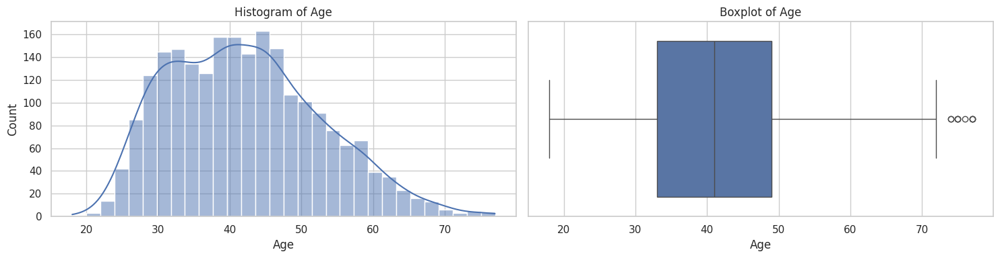

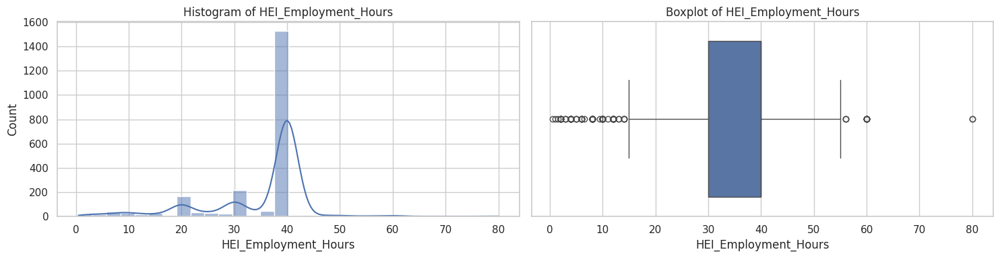

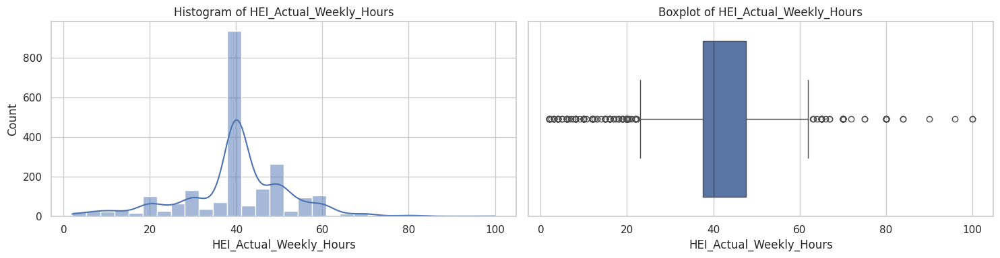

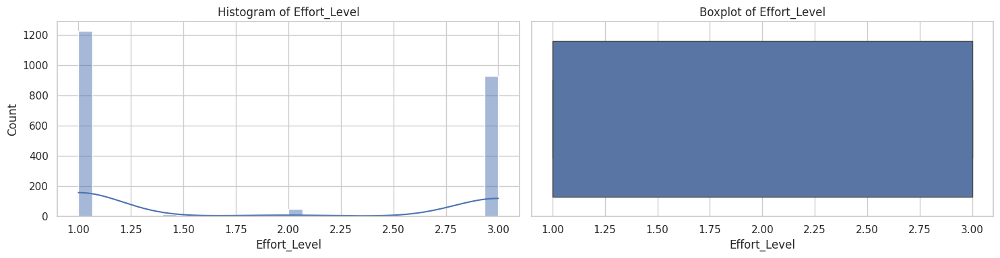

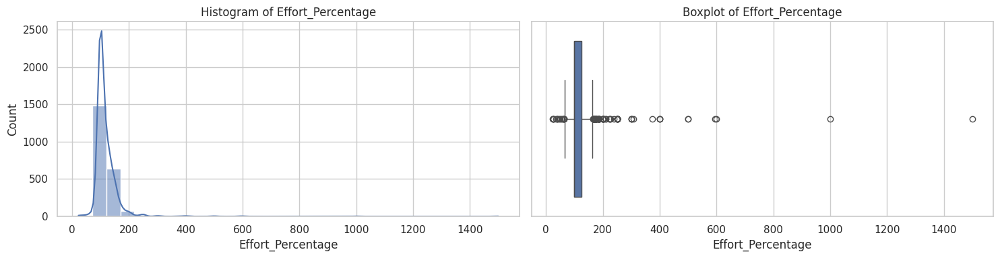

...

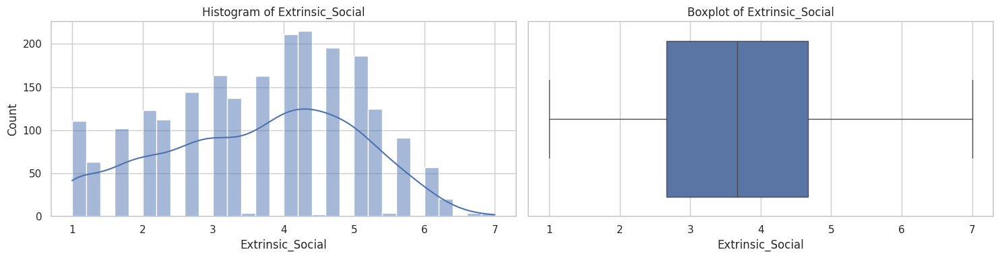

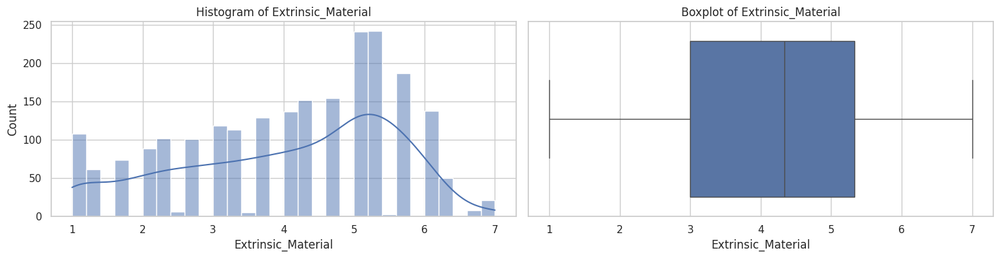

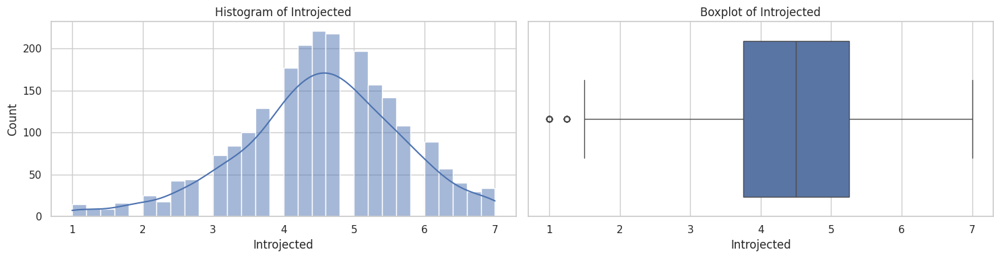

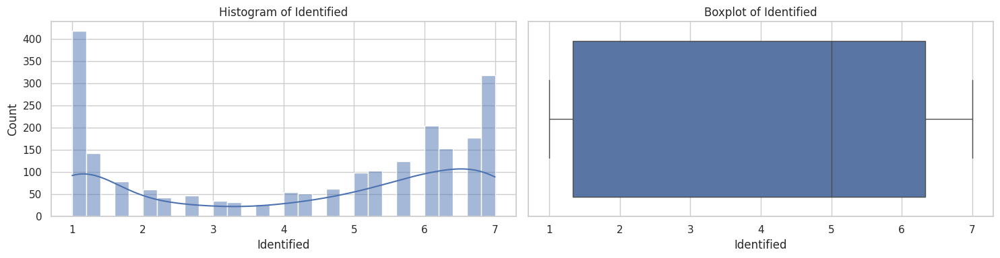

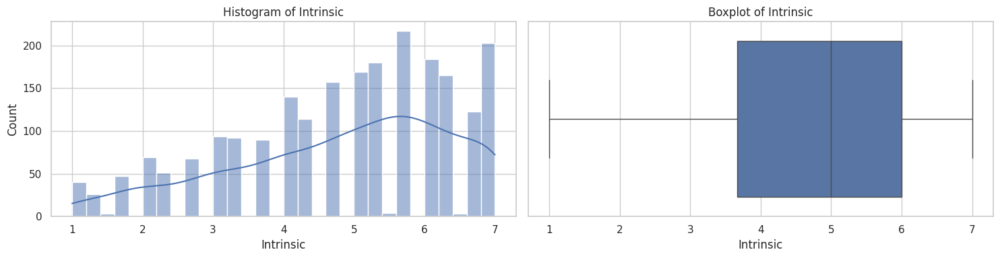

##### Categorical Distributions

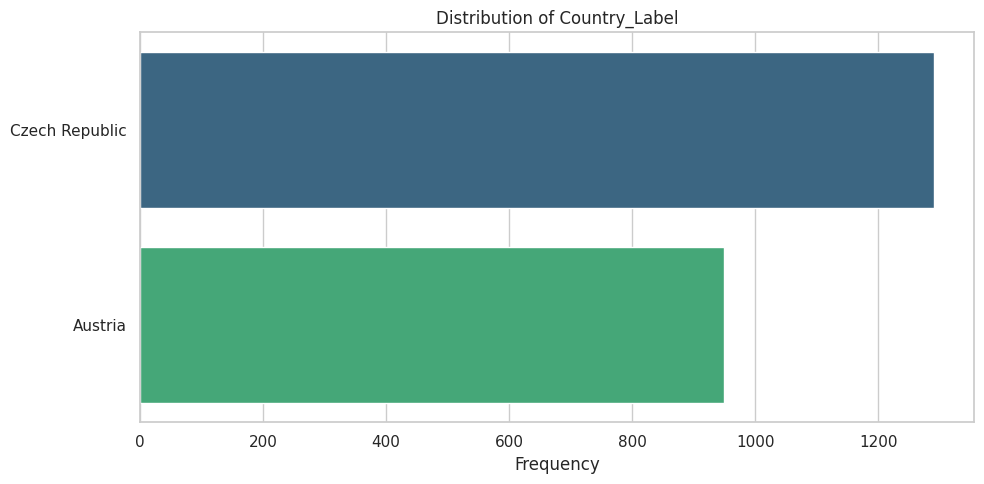

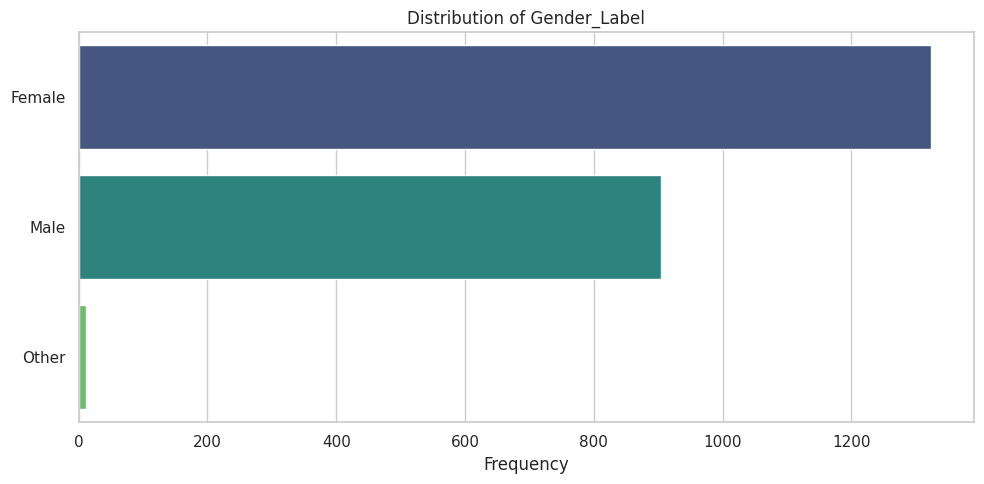

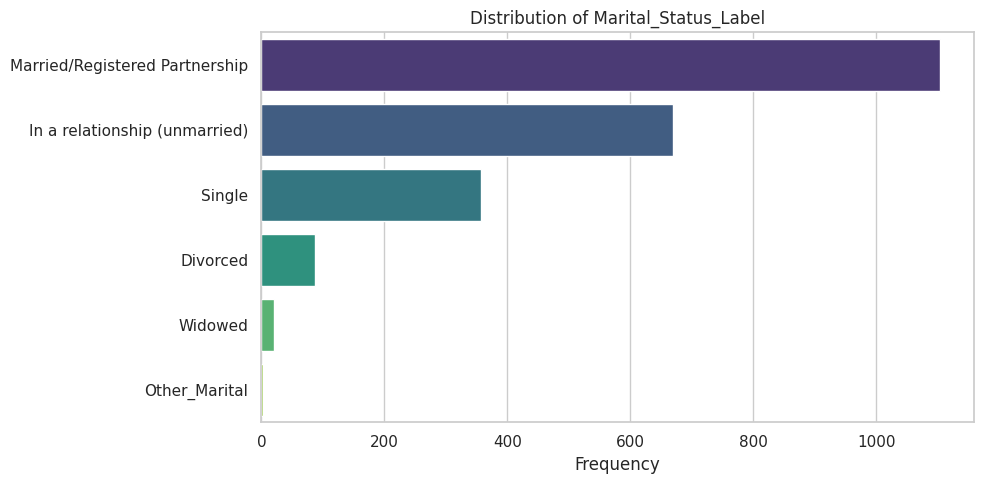

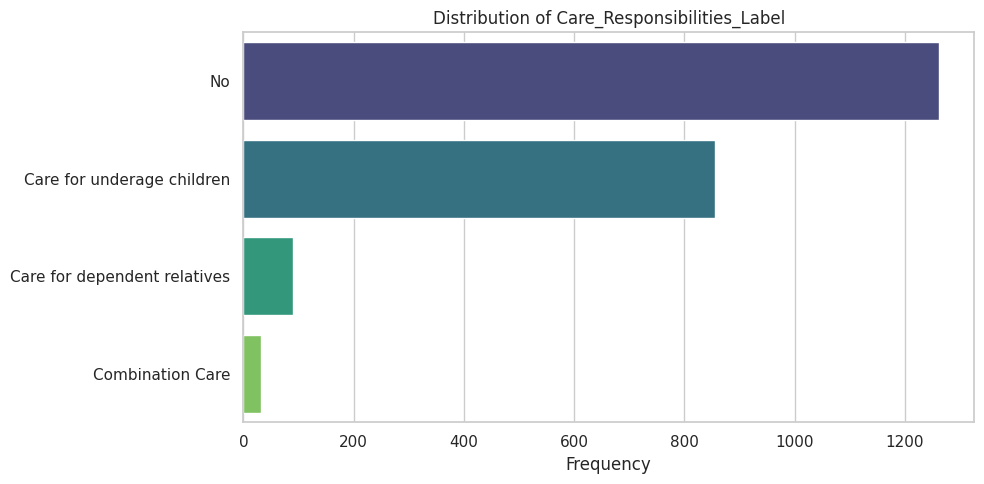

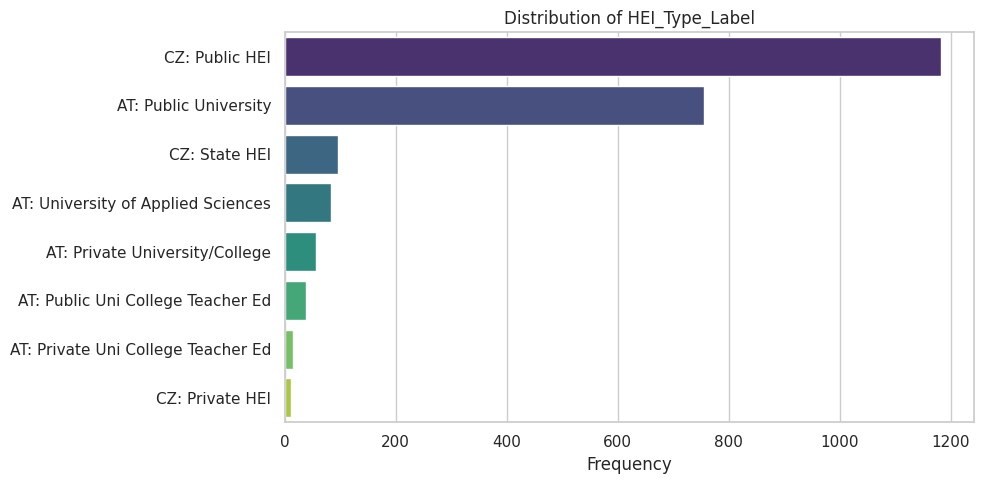

...

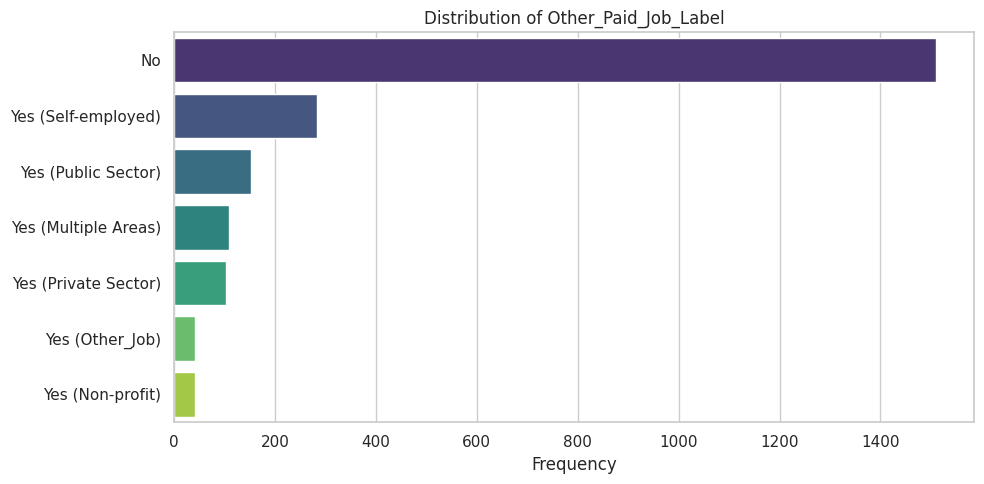

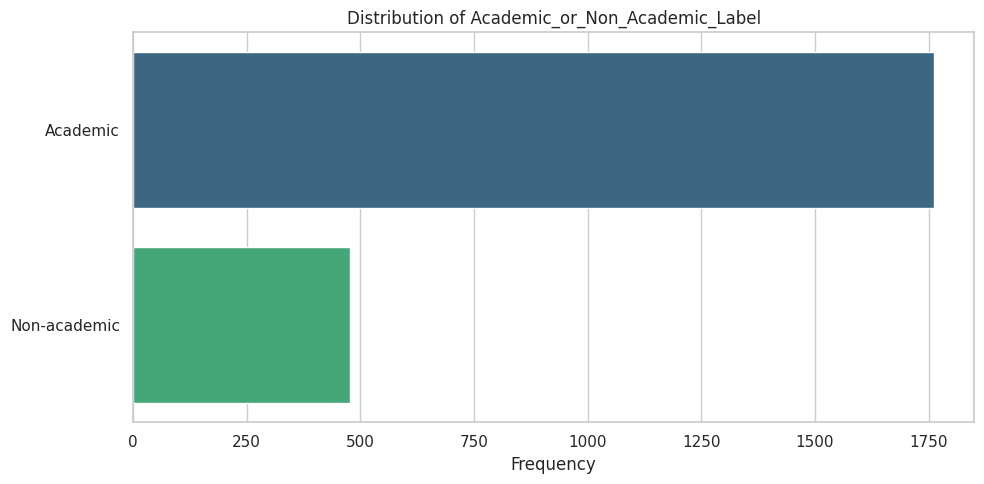

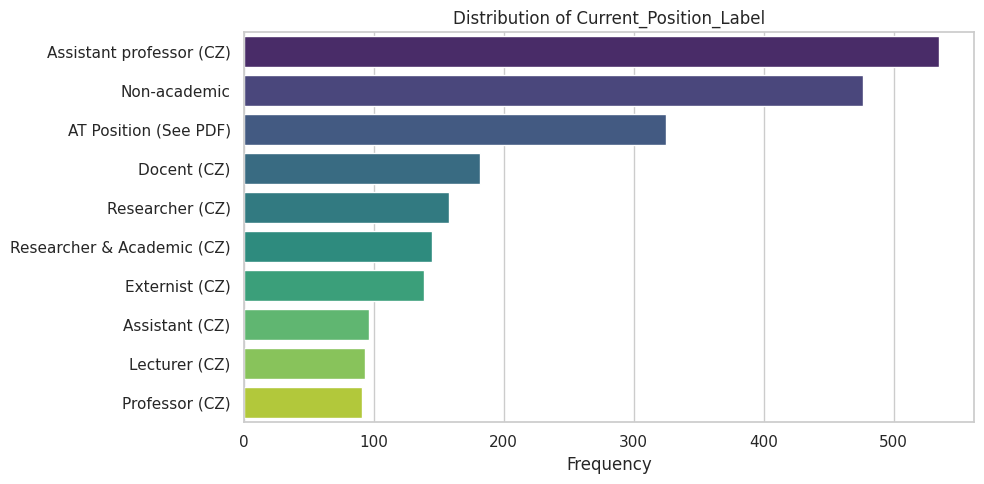

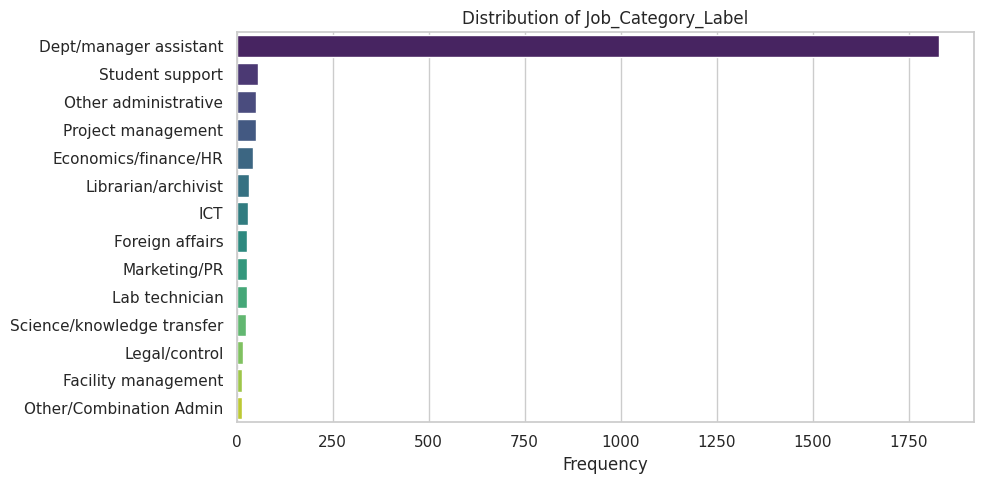

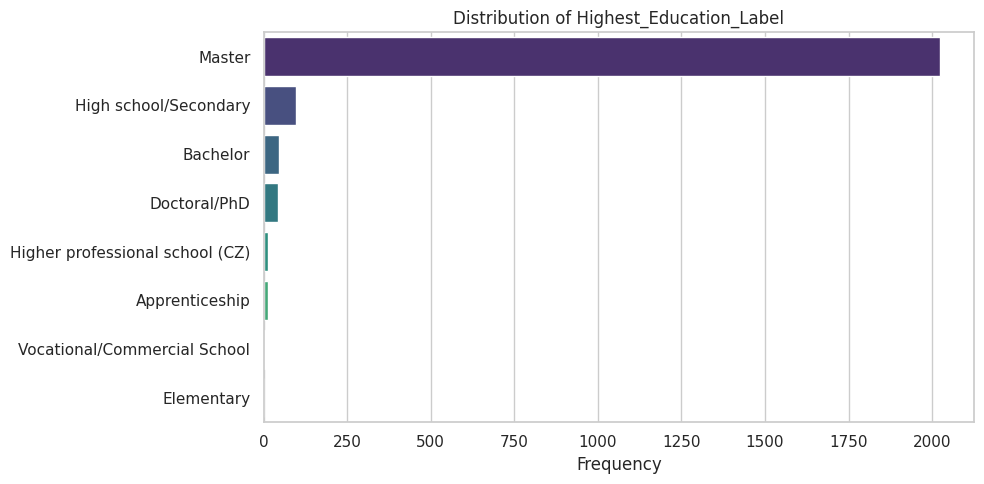

In [38]:
if not df_cleaned.empty:
    display(Markdown("#### Univariate Visualizations"))

    # --- Plots for Numerical Variables (Histogram and Boxplot) ---
    # Use the same selection as for descriptive stats
    numeric_cols_final = df_cleaned.select_dtypes(include=np.number).columns
    cols_to_exclude_plots = ['Version', 'Country', 'Gender', 'Marital_Status', 'Care_Responsibilities',
                             'HEI_Type', 'Faculty_Subject_Area', 'Employment_Contract_Duration',
                             'Leadership_Position', 'Other_Paid_Job', 'Academic_or_Non_Academic',
                             'Current_Position', 'Job_Category', 'Highest_Education_Level']
    numeric_cols_for_plots = numeric_cols_final.difference(cols_to_exclude_plots, sort=False)

    if not numeric_cols_for_plots.empty:
        display(Markdown("##### Numerical Distributions"))
        for col in numeric_cols_for_plots:
            fig, axes = plt.subplots(1, 2, figsize=(15, 4))

            # Histogram with KDE
            sns.histplot(df_cleaned[col], kde=True, ax=axes[0], bins=30)
            axes[0].set_title(f'Histogram of {col}')

            # Boxplot
            sns.boxplot(x=df_cleaned[col], ax=axes[1])
            axes[1].set_title(f'Boxplot of {col}')

            plt.tight_layout()
            plt.show()
    else:
        print("No numerical columns found for plotting after exclusions.")

    # --- Plots for Categorical Variables (Bar Chart) ---
    # Use the labeled columns
    categorical_cols_final = [col for col in df_cleaned.columns if col.endswith('_Label')]
    display(Markdown("##### Categorical Distributions"))
    for col in categorical_cols_final:
        plt.figure(figsize=(10, 5))
        # Order bars by frequency descending for better visualization
        try:
             order = df_cleaned[col].value_counts().index
             sns.countplot(y=df_cleaned[col], order=order, palette='viridis') # Use 'y' for potentially long labels
             plt.title(f'Distribution of {col}')
             plt.xlabel('Frequency')
             plt.ylabel('') # Hide y-label if redundant with title
             plt.tight_layout()
             plt.show()
        except Exception as e:
             print(f"Could not plot {col}. Error: {e}")
             if plt.gcf().get_axes(): # Close the potentially empty figure
                 plt.close()

else:
    print("Empty DataFrame, univariate visualizations skipped.")

### 5.2 Bivariate and Multivariate Analysis

Explore relationships between pairs of variables and among multiple variables using scatter plots, correlation matrices, and other comparative plots.

#### Scatter Plot Matrix (Pairplot) for Key Numerical Variables

Generating pairplot for: ['Age', 'Job_Satisfaction', 'Burnout', 'Salary_per_Hour', 'HEI_Actual_Weekly_Hours', 'Perceived_Autonomy', 'Performance_Pressure']


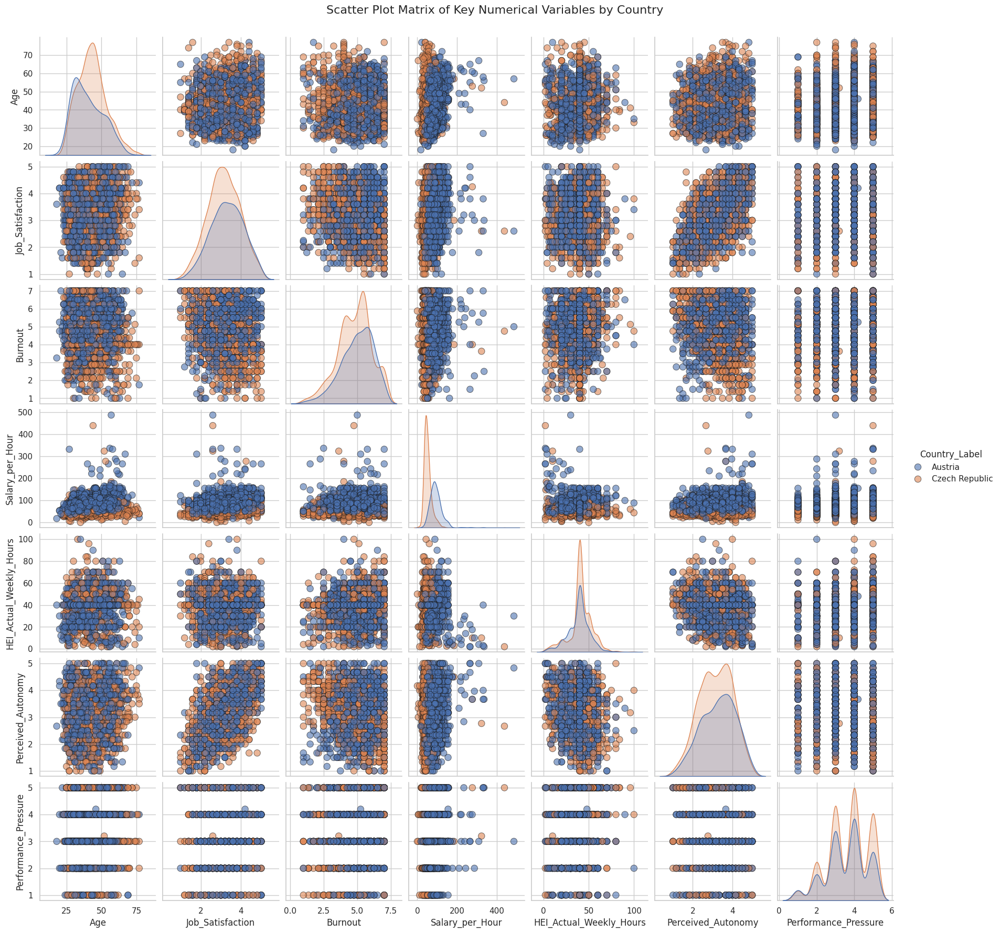

In [39]:
if not df_cleaned.empty:
    display(Markdown("#### Scatter Plot Matrix (Pairplot) for Key Numerical Variables"))

    # Select a subset of key numerical variables for the pairplot
    pairplot_vars = [
        'Age', 'Job_Satisfaction', 'Burnout', 'Salary_per_Hour',
        'HEI_Actual_Weekly_Hours', 'Perceived_Autonomy', 'Performance_Pressure'
    ]
    # Filter to only include variables actually present in the cleaned dataframe
    pairplot_vars_present = [var for var in pairplot_vars if var in df_cleaned.columns and pd.api.types.is_numeric_dtype(df_cleaned[var])]

    if len(pairplot_vars_present) > 1:
        print(f"Generating pairplot for: {pairplot_vars_present}")
        # Use hue='Country_Label' to see differences between countries
        sns.pairplot(df_cleaned[pairplot_vars_present + ['Country_Label']].dropna(),
                     hue='Country_Label',
                     diag_kind='kde', # Kernel density estimate on diagonals
                     plot_kws={'alpha': 0.6, 's': 80, 'edgecolor': 'k'}, # Scatter plot settings
                     height=2.5) # Size of each subplot
        plt.suptitle('Scatter Plot Matrix of Key Numerical Variables by Country', y=1.02, fontsize=16)
        plt.show()
    else:
        print("Not enough numerical variables found for pairplot.")
else:
    print("Empty DataFrame or missing key variables, pairplot skipped.")

#### Correlation Matrix (Quantitative Variables)

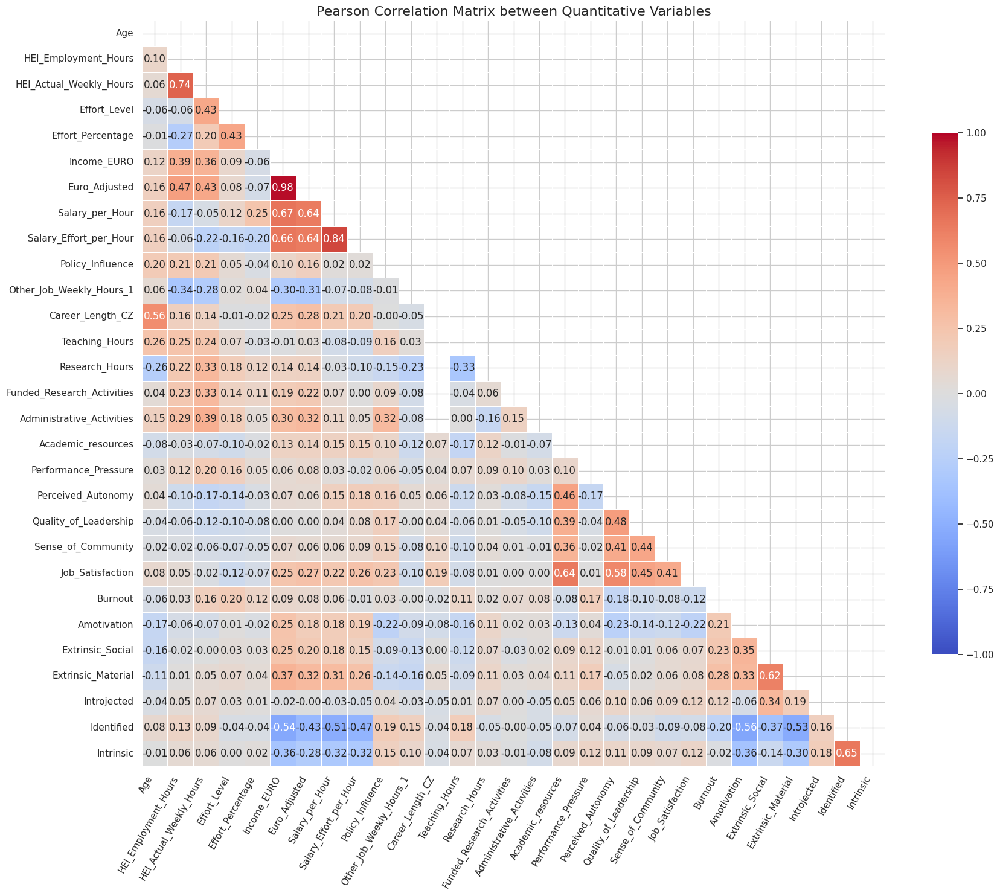

In [40]:
if not df_cleaned.empty:
    display(Markdown("#### Correlation Matrix (Quantitative Variables)"))

    # Select only quantitative (numerical) columns for correlation
    # Reuse the selection from univariate stats
    numeric_cols_final = df_cleaned.select_dtypes(include=np.number).columns
    cols_to_exclude_corr = ['Version', 'Country', 'Gender', 'Marital_Status', 'Care_Responsibilities',
                           'HEI_Type', 'Faculty_Subject_Area', 'Employment_Contract_Duration',
                           'Leadership_Position', 'Other_Paid_Job', 'Academic_or_Non_Academic',
                           'Current_Position', 'Job_Category', 'Highest_Education_Level']
    numeric_cols_for_corr = numeric_cols_final.difference(cols_to_exclude_corr, sort=False)

    if not numeric_cols_for_corr.empty:
        # Calculate Pearson correlation matrix
        correlation_matrix = df_cleaned[numeric_cols_for_corr].corr(method='pearson')

        # Create mask for the upper triangle
        mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

        # Set up and display the heatmap
        plt.figure(figsize=(18, 15))
        sns.heatmap(correlation_matrix,
                    mask=mask,
                    cmap='coolwarm',
                    vmax=1, vmin=-1,
                    center=0,
                    linewidths=.5,
                    cbar_kws={"shrink": .7},
                    annot=True, # Show values on the heatmap
                    fmt=".2f") # Format for annotation values
        plt.title('Pearson Correlation Matrix between Quantitative Variables', fontsize=16)
        plt.xticks(rotation=60, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()
    else:
        print("No quantitative columns found for correlation analysis after exclusions.")
else:
    print("Empty DataFrame, correlation analysis skipped.")

#### Additional Bivariate Plots for Bias Identification

##### Comparing Key Metrics Across Groups

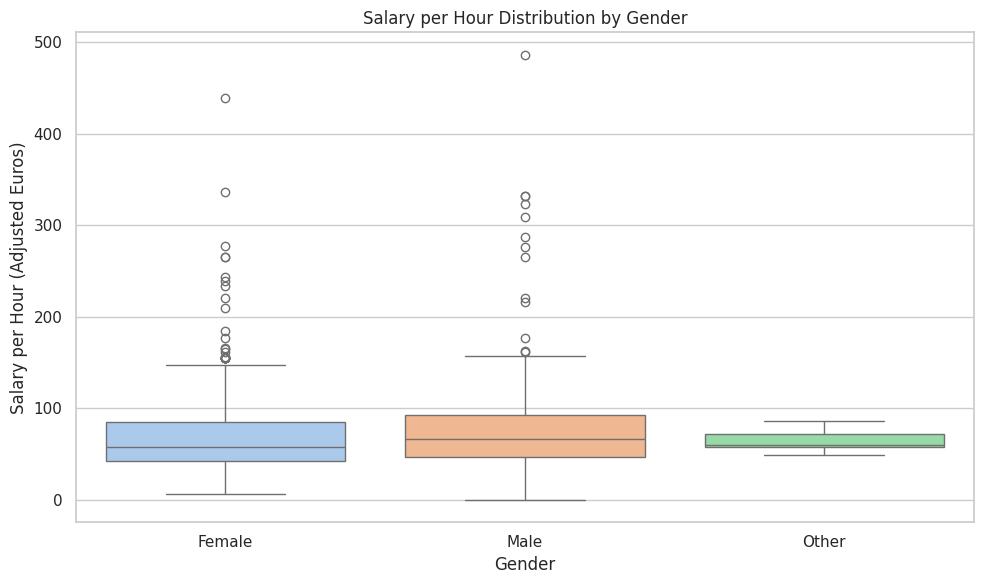

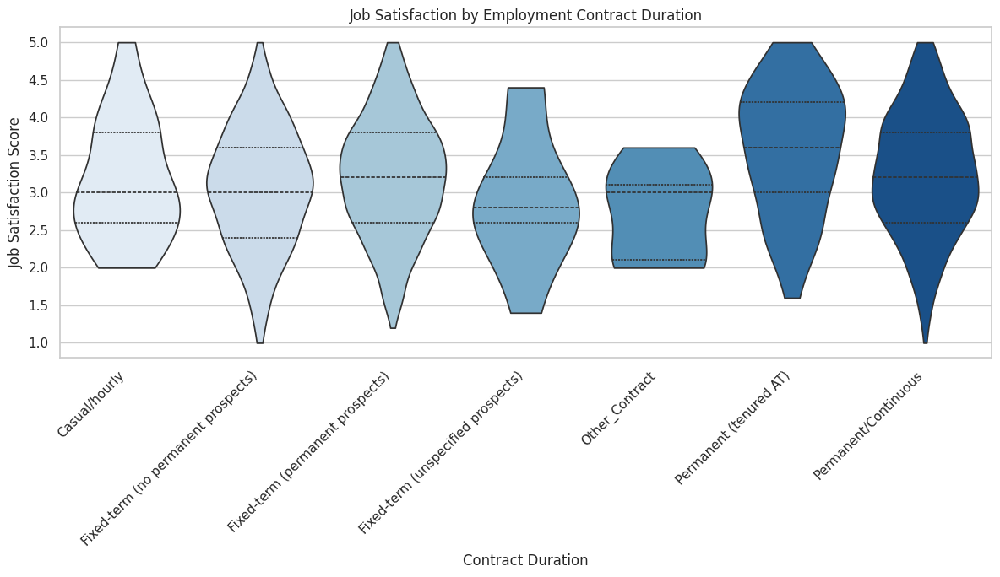

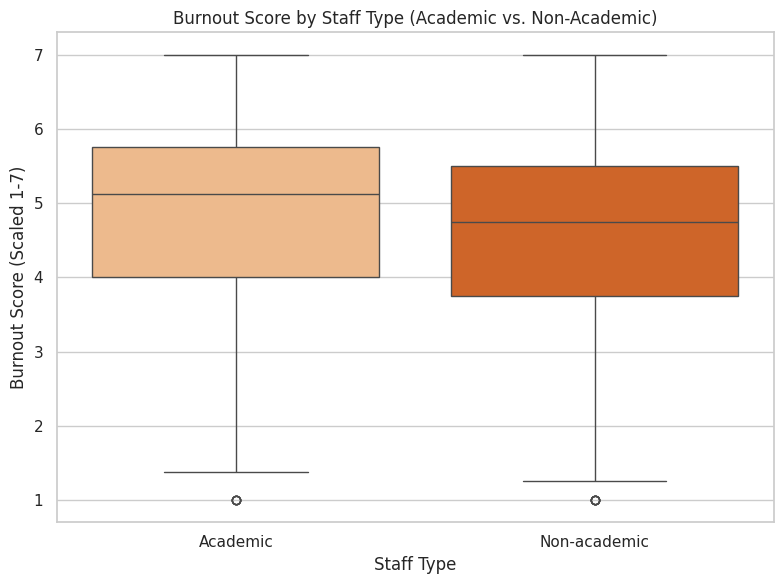

##### Count of HEI Types by Country

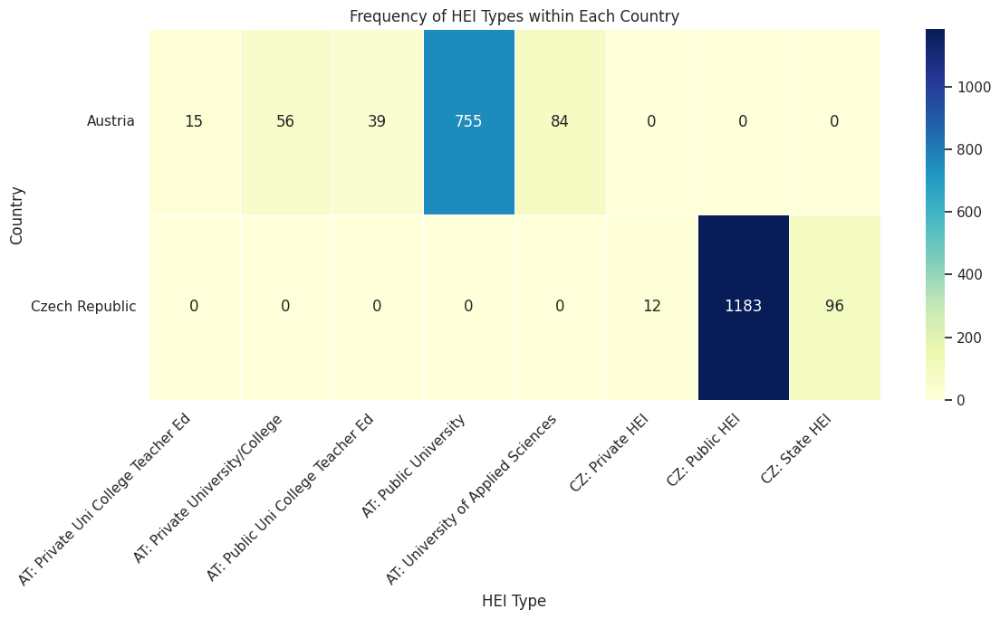

In [41]:
if not df_cleaned.empty:
    display(Markdown("##### Comparing Key Metrics Across Groups"))

    # --- Example 1: Salary per Hour vs. Gender ---
    if 'Salary_per_Hour' in df_cleaned.columns and 'Gender_Label' in df_cleaned.columns:
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='Gender_Label', y='Salary_per_Hour', data=df_cleaned, palette='pastel')
        plt.title('Salary per Hour Distribution by Gender')
        plt.xlabel('Gender')
        plt.ylabel('Salary per Hour (Adjusted Euros)')
        plt.xticks(rotation=0)
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Salary vs Gender plot (missing columns).")

    # --- Example 2: Job Satisfaction vs. Employment Contract Duration ---
    if 'Job_Satisfaction' in df_cleaned.columns and 'Employment_Contract_Duration_Label' in df_cleaned.columns:
        plt.figure(figsize=(12, 7))
        # Using violin plot to show density
        sns.violinplot(x='Employment_Contract_Duration_Label', y='Job_Satisfaction', data=df_cleaned, palette='Blues', cut=0, inner='quartile')
        plt.title('Job Satisfaction by Employment Contract Duration')
        plt.xlabel('Contract Duration')
        plt.ylabel('Job Satisfaction Score')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Job Satisfaction vs Contract plot (missing columns).")

    # --- Example 3: Burnout vs. Academic/Non-Academic ---
    if 'Burnout' in df_cleaned.columns and 'Academic_or_Non_Academic_Label' in df_cleaned.columns:
        plt.figure(figsize=(8, 6))
        sns.boxplot(x='Academic_or_Non_Academic_Label', y='Burnout', data=df_cleaned, palette='Oranges')
        plt.title('Burnout Score by Staff Type (Academic vs. Non-Academic)')
        plt.xlabel('Staff Type')
        plt.ylabel('Burnout Score (Scaled 1-7)')
        plt.xticks(rotation=0)
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Burnout vs Staff Type plot (missing columns).")

    # --- Example 4: Crosstabulation Heatmap - Country vs. HEI Type ---
    if 'Country_Label' in df_cleaned.columns and 'HEI_Type_Label' in df_cleaned.columns:
        display(Markdown("##### Count of HEI Types by Country"))
        crosstab_hei = pd.crosstab(df_cleaned['Country_Label'], df_cleaned['HEI_Type_Label'])
        plt.figure(figsize=(12, 7))
        sns.heatmap(crosstab_hei, annot=True, fmt='d', cmap='YlGnBu', linewidths=.5)
        plt.title('Frequency of HEI Types within Each Country')
        plt.xlabel('HEI Type')
        plt.ylabel('Country')
        plt.yticks(rotation=0)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
    else:
        print("Skipping Country vs HEI Type heatmap (missing columns).")

else:
    print("Empty DataFrame, additional bivariate plots skipped.")

### 5.3 Disparity Analysis (Grouped Statistics and Comparative Plots)

We will explore how key well-being variables vary according to:
* `Country_Label`
* `Gender_Label`
* `HEI_Type_Label`
* `Faculty_Subject_Area_Label`
* Age Group (`Age_Group` - to be created)

In [42]:
if not df_cleaned.empty:
    # Create age groups
    age_bins = [0, 29, 39, 49, 59, np.inf] # Define boundaries: <=29, 30-39, 40-49, 50-59, 60+
    age_labels = ['<30', '30-39', '40-49', '50-59', '60+']
    if 'Age' in df_cleaned.columns:
        df_cleaned['Age_Group'] = pd.cut(df_cleaned['Age'], bins=age_bins, labels=age_labels, right=True)
        # Convert Age_Group to category type explicitly
        df_cleaned['Age_Group'] = df_cleaned['Age_Group'].astype('category')
        print("'Age_Group' column created.")
        display(df_cleaned[['Age', 'Age_Group']].head())
    else:
        print("'Age' column not found, could not create 'Age_Group'.")
else:
    print("Empty DataFrame, age group creation skipped.")

'Age_Group' column created.


,Age,Age_Group
0,28.0,<30
1,33.0,30-39
2,39.0,30-39
3,39.0,30-39
4,44.0,40-49


Well-being variables to analyze: ['Job_Satisfaction', 'Burnout', 'Perceived_Autonomy', 'Performance_Pressure', 'Quality_of_Leadership', 'Sense_of_Community', 'Salary_per_Hour', 'HEI_Actual_Weekly_Hours']


#### Grouped Analysis by: Country_Label

Job_Satisfaction          Burnout        Perceived_Autonomy  \
                           mean median      mean median               mean   
Country_Label                                                                
Austria                3.307271    3.4  4.994415   5.00           3.280365   
Czech Republic         3.147211    3.2  4.790143   4.75           3.155203   

                         Performance_Pressure        Quality_of_Leadership  \
                  median                 mean median                  mean   
Country_Label                                                                
Austria         3.333333             3.560801    4.0              3.275079   
Czech Republic  3.166667             3.667080    4.0              3.232623   

                      Sense_of_Community           Salary_per_Hour             \
               median               mean    median            mean     median   
Country_Label                                                                   
Austria          3.50           4.046540  4.333333       94.696054  88.400000   
Czech Republic   3.25           3.862639  4.000000       52.511406  46.851358   

               HEI_Actual_Weekly_Hours         
                                  mean median  
Country_Label                                  
Austria                      38.778714   40.0  
Czech Republic               40.981952   40.0

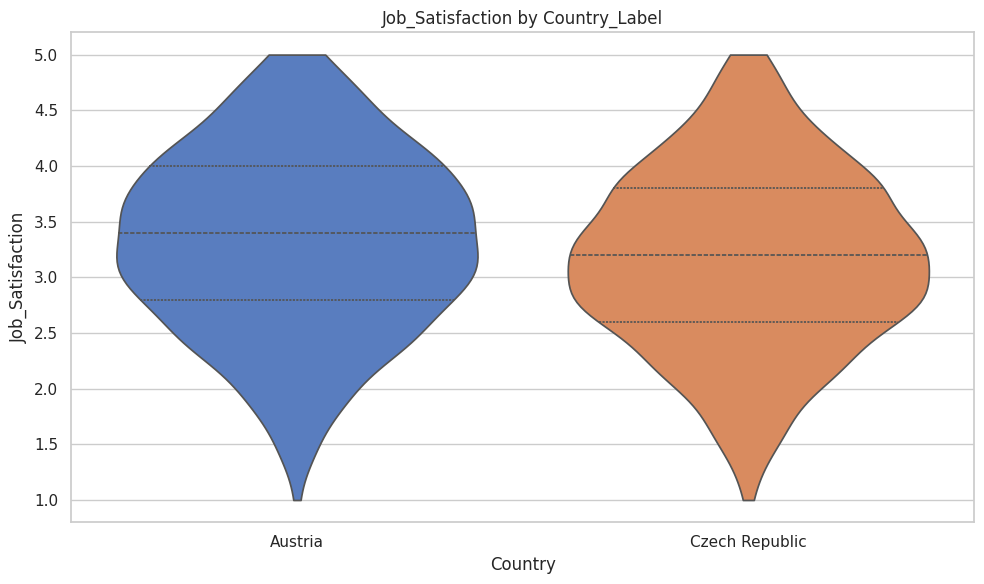

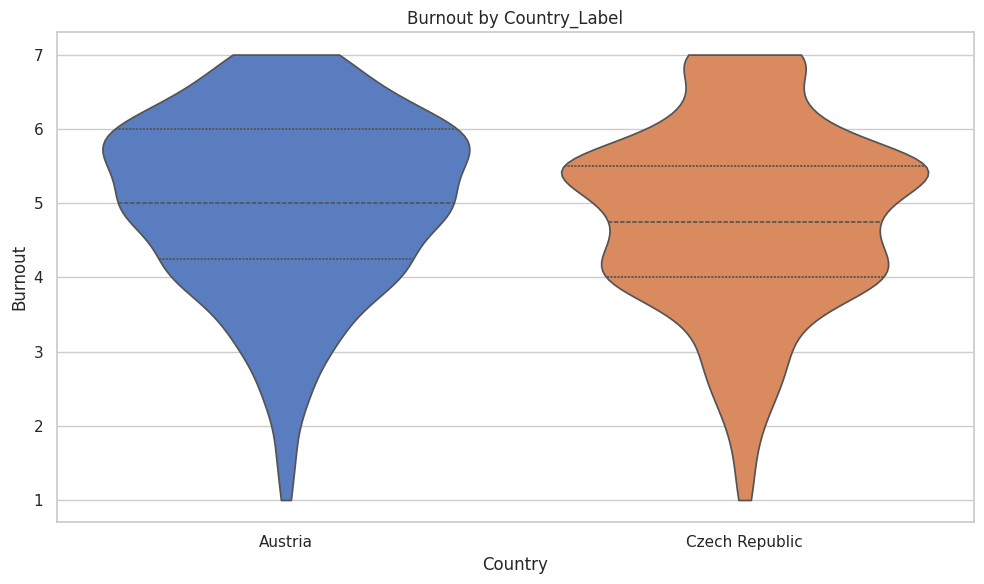

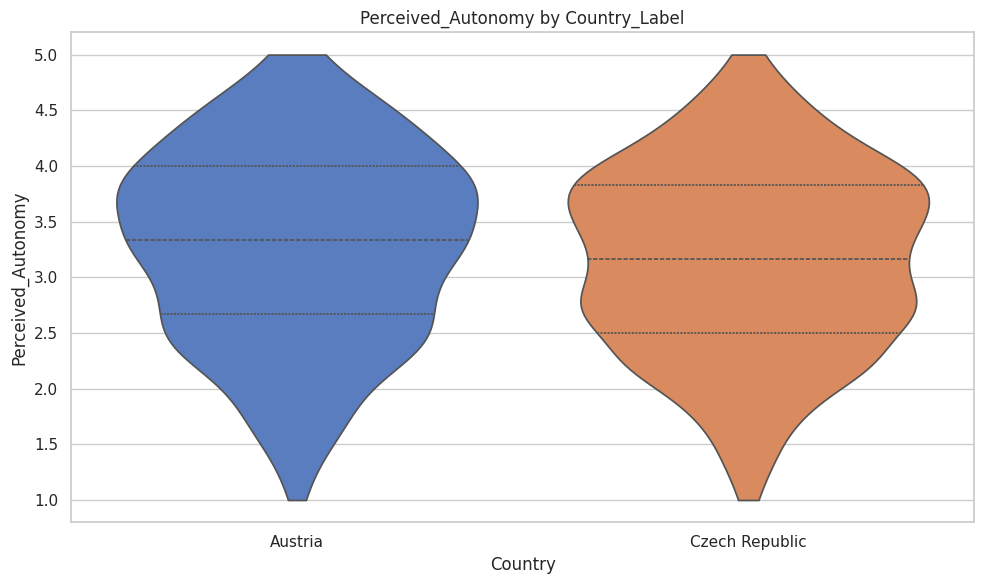

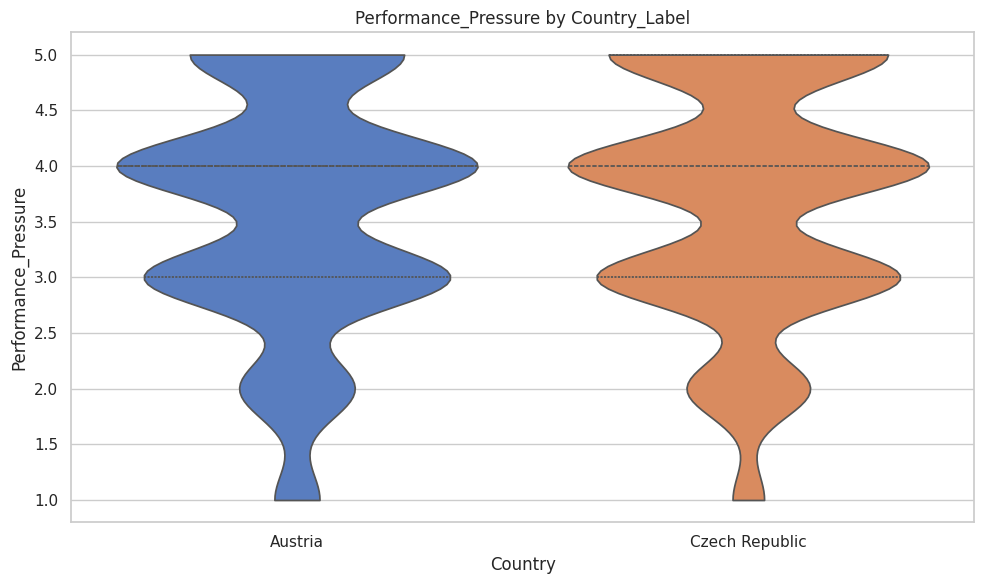

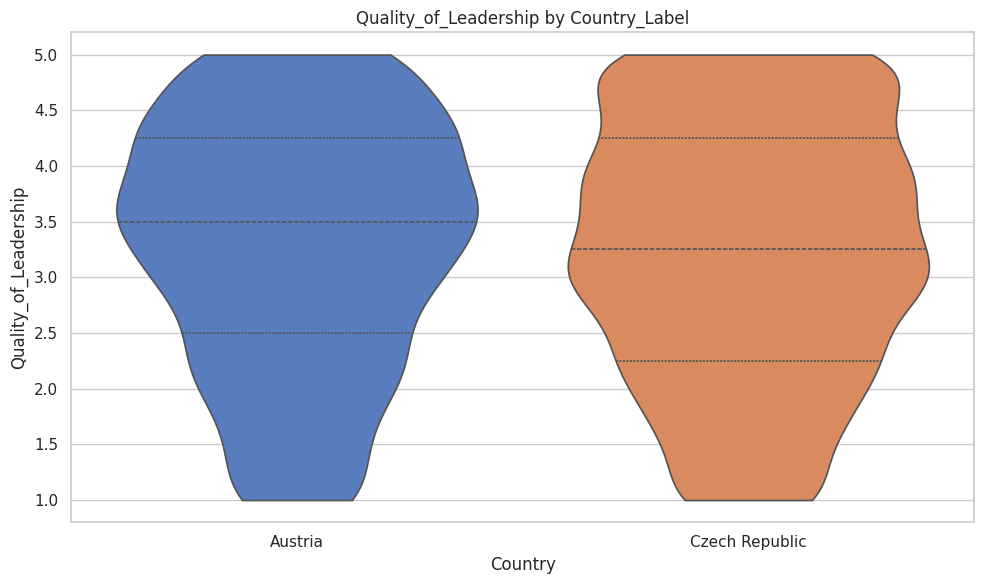

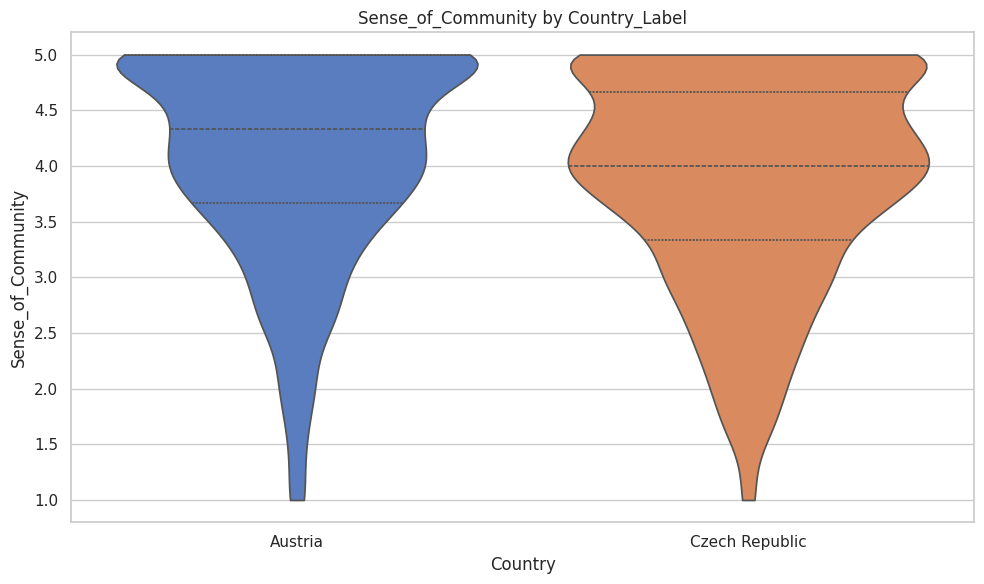

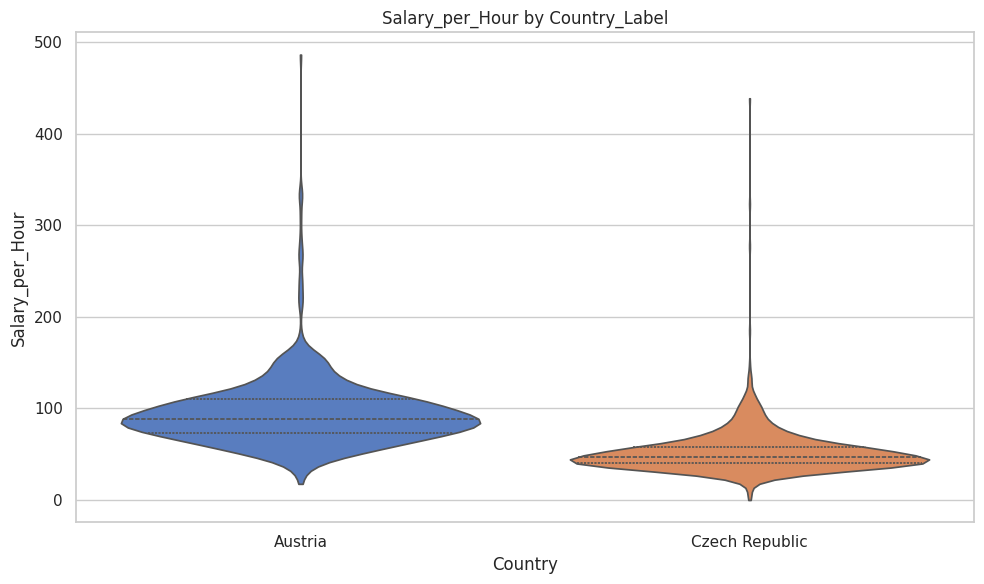

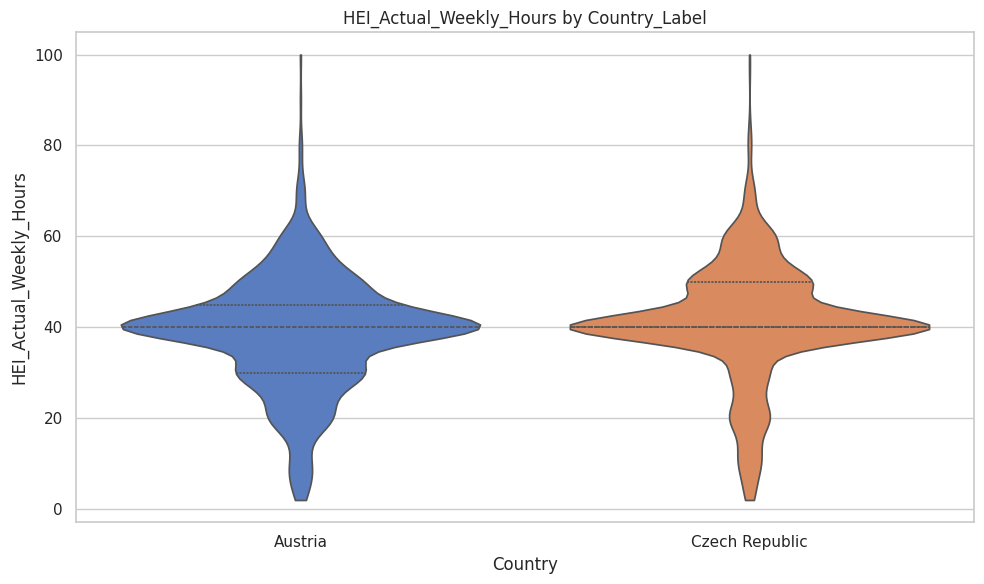

#### Grouped Analysis by: Gender_Label

Job_Satisfaction          Burnout        Perceived_Autonomy  \
                         mean median      mean median               mean   
Gender_Label                                                               
Female               3.182779    3.2  4.977486  5.125           3.148968   
Male                 3.263481    3.2  4.725645  4.750           3.300589   
Other                3.109091    3.0  5.170455  5.000           2.742424   

                       Performance_Pressure        Quality_of_Leadership  \
                median                 mean median                  mean   
Gender_Label                                                               
Female        3.166667             3.661631    4.0              3.195619   
Male          3.333333             3.560663    4.0              3.328858   
Other         2.666667             3.909091    4.0              3.431818   

                    Sense_of_Community           Salary_per_Hour             \
             median               mean    median            mean     median   
Gender_Label                                                                  
Female         3.25           3.970796  4.000000       67.261249  57.698717   
Male           3.50           3.893370  4.000000       75.018671  66.930512   
Other          3.50           4.181818  4.333333       64.817290  59.670000   

             HEI_Actual_Weekly_Hours         
                                mean median  
Gender_Label                                 
Female                     39.212727   40.0  
Male                       41.331547   40.0  
Other                      35.090909   30.0

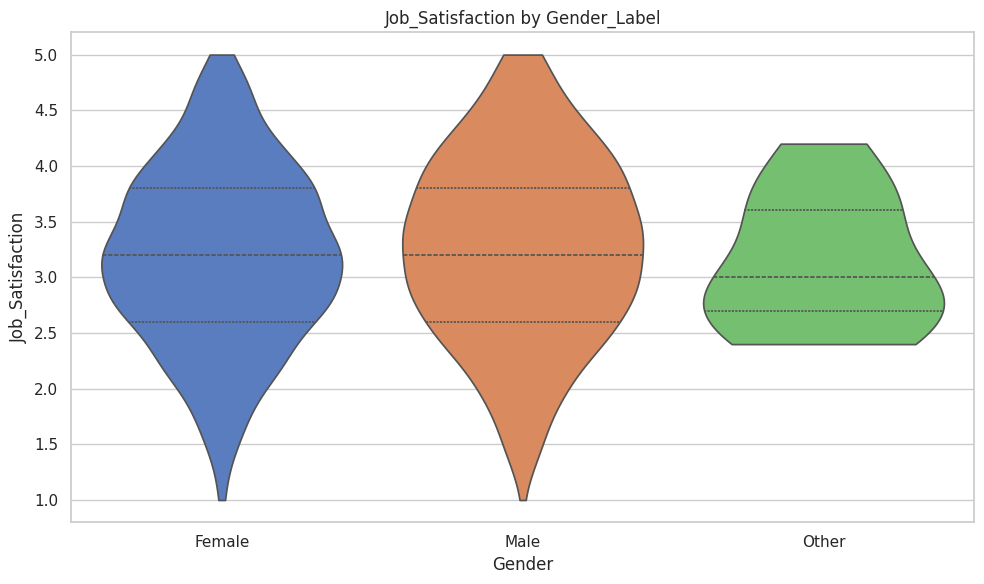

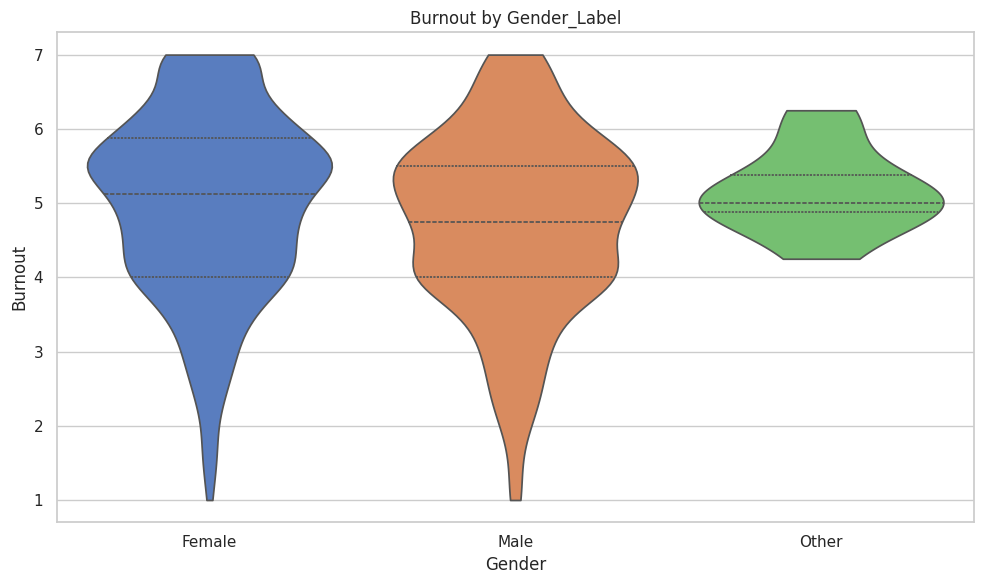

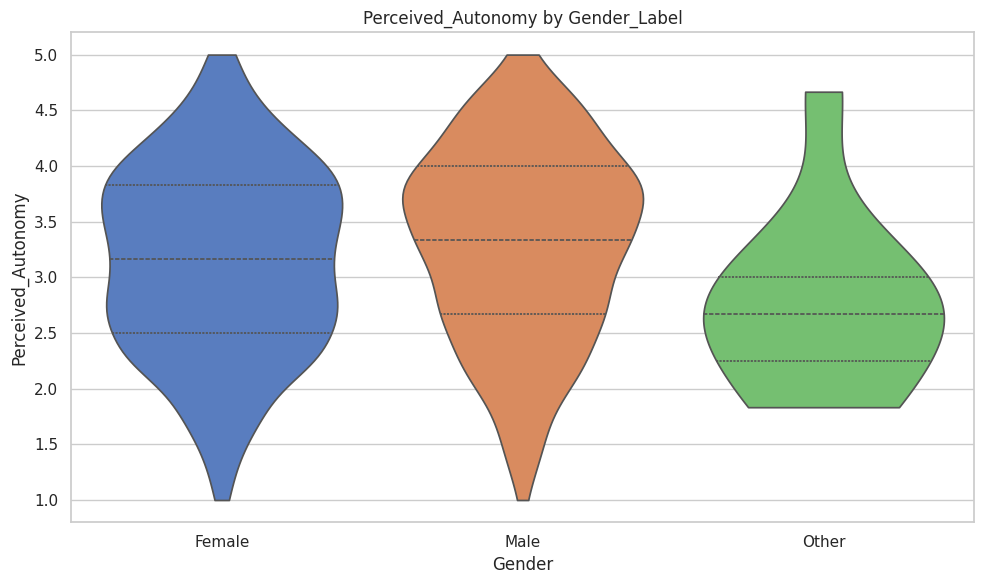

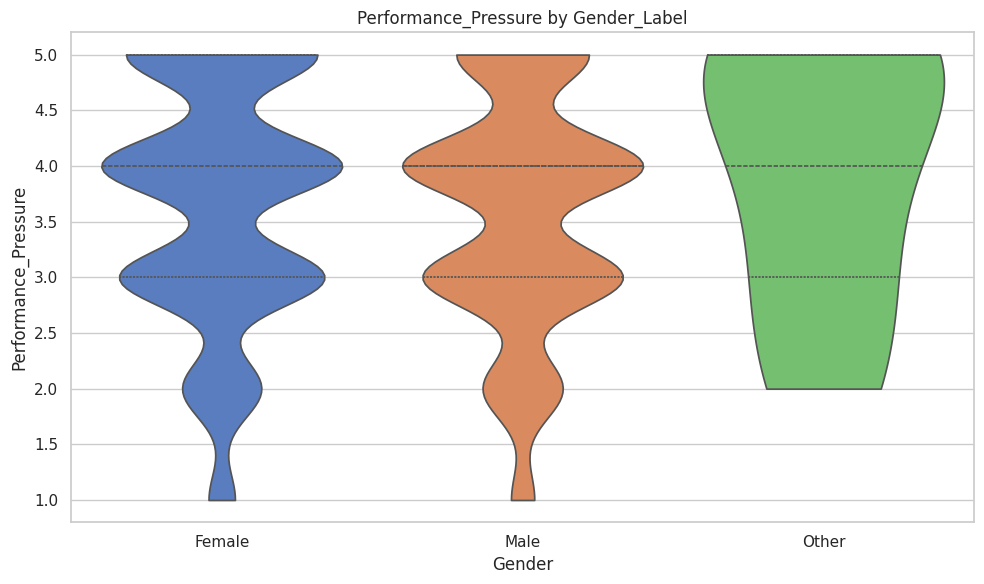

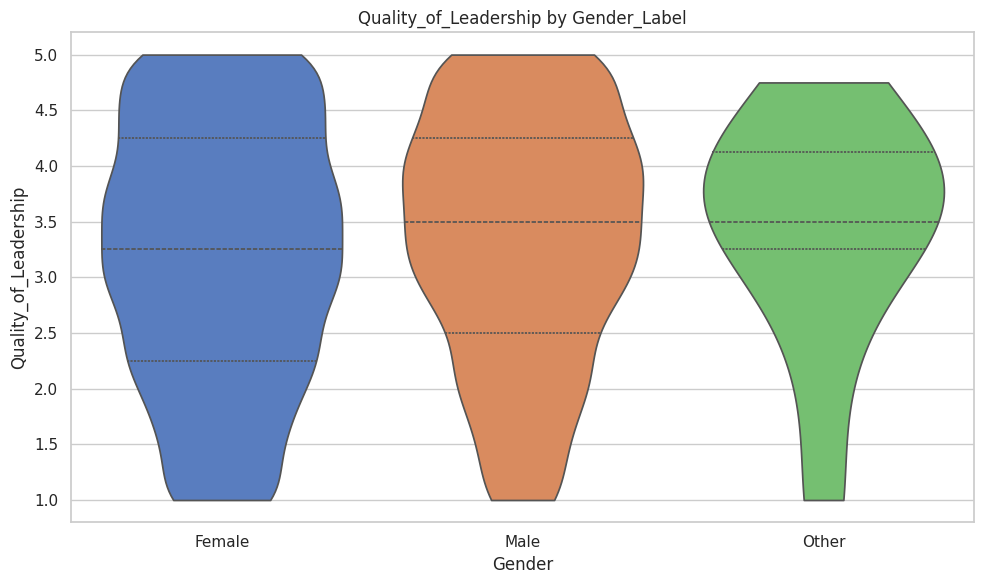

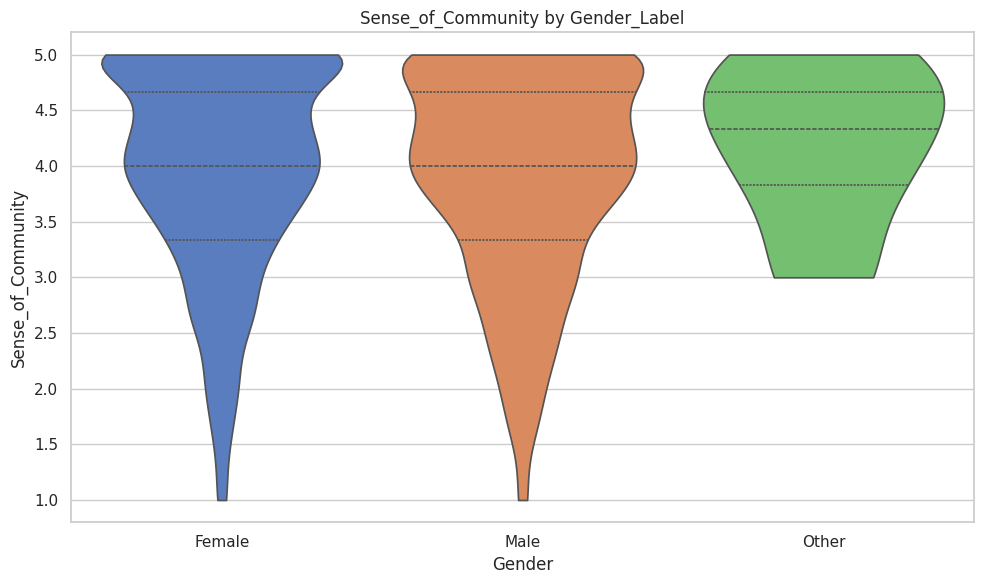

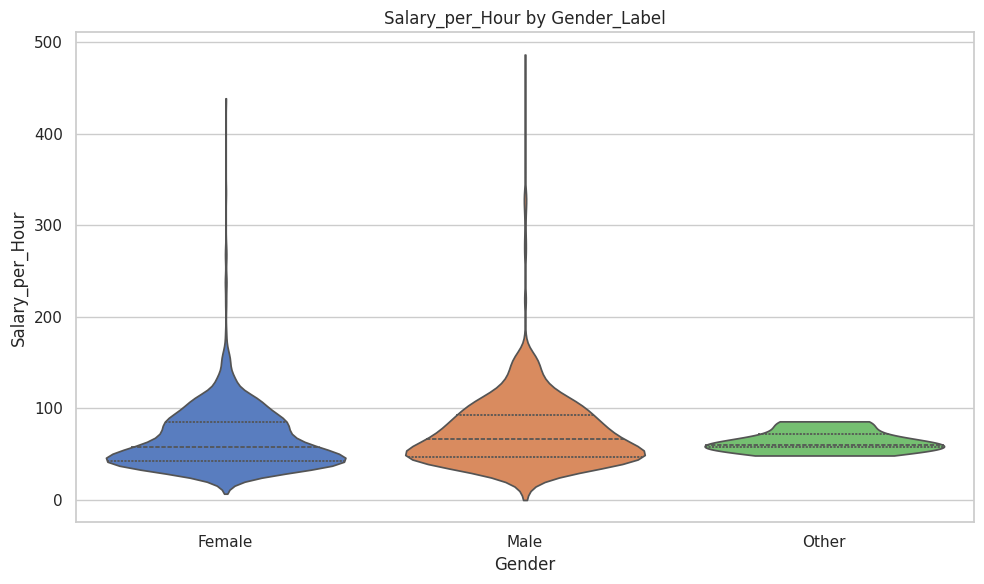

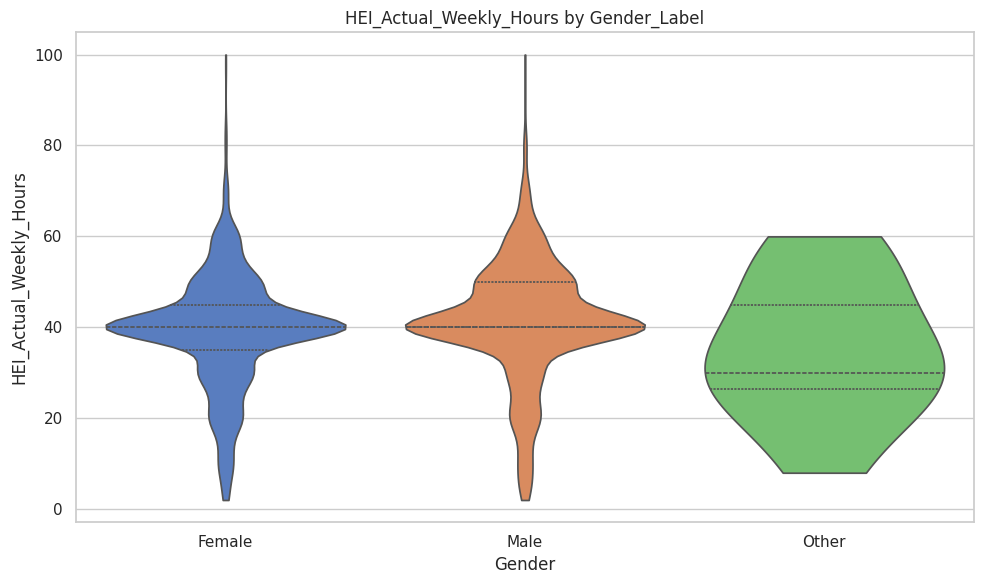

#### Grouped Analysis by: HEI_Type_Label

Job_Satisfaction          Burnout          \
                                               mean median      mean  median   
HEI_Type_Label                                                                 
AT: Private Uni College Teacher Ed         3.600000    3.6  5.133333  5.0000   
AT: Private University/College             3.482143    3.5  4.950893  5.0000   
AT: Public Uni College Teacher Ed          3.539744    3.6  5.269231  5.5000   
AT: Public University                      3.275298    3.2  4.976313  5.0000   
AT: University of Applied Sciences         3.317857    3.4  5.033730  5.5000   
CZ: Private HEI                            3.033333    3.0  4.218750  4.5625   
CZ: Public HEI                             3.134615    3.2  4.831467  5.1250   
CZ: State HEI                              3.316667    3.4  4.352344  4.3750   

                                   Perceived_Autonomy            \
                                                 mean    median   
HEI_Type_Label                                                    
AT: Private Uni College Teacher Ed           3.100000  3.166667   
AT: Private University/College               3.477381  3.500000   
AT: Public Uni College Teacher Ed            3.297436  3.166667   
AT: Public University                        3.269492  3.333333   
AT: University of Applied Sciences           3.271032  3.333333   
CZ: Private HEI                              3.430556  3.583333   
CZ: Public HEI                               3.159425  3.166667   
CZ: State HEI                                3.068750  3.166667   

                                   Performance_Pressure         \
                                                   mean median   
HEI_Type_Label                                                   
AT: Private Uni College Teacher Ed             3.600000    4.0   
AT: Private University/College                 3.482143    4.0   
AT: Public Uni College Teacher Ed              3.435897    4.0   
AT: Public University                          3.567152    4.0   
AT: University of Applied Sciences             3.607143    4.0   
CZ: Private HEI                                3.250000    3.0   
CZ: Public HEI                                 3.699239    4.0   
CZ: State HEI                                  3.322917    3.0   

                                   Quality_of_Leadership         \
                                                    mean median   
HEI_Type_Label                                                    
AT: Private Uni College Teacher Ed              3.350000  3.250   
AT: Private University/College                  3.338988  3.375   
AT: Public Uni College Teacher Ed               3.583333  4.000   
AT: Public University                           3.239934  3.500   
AT: University of Applied Sciences              3.391865  3.500   
CZ: Private HEI                                 2.388889  2.500   
CZ: Public HEI                                  3.241040  3.250   
CZ: State HEI                                   3.234375  3.250   

                                   Sense_of_Community            \
                                                 mean    median   
HEI_Type_Label                                                    
AT: Private Uni College Teacher Ed           3.844444  3.666667   
AT: Private University/College               4.047619  4.333333   
AT: Public Uni College Teacher Ed            4.111111  4.333333   
AT: Public University                        4.024945  4.333333   
AT: University of Applied Sciences           4.246032  4.333333   
CZ: Private HEI                              3.805556  4.000000   
CZ: Public HEI                               3.855030  4.000000   
CZ: State HEI                                3.963542  4.000000   

                                   Salary_per_Hour              \
                                              mean      median   
HEI_Type_Label                                                   
AT: Private Uni

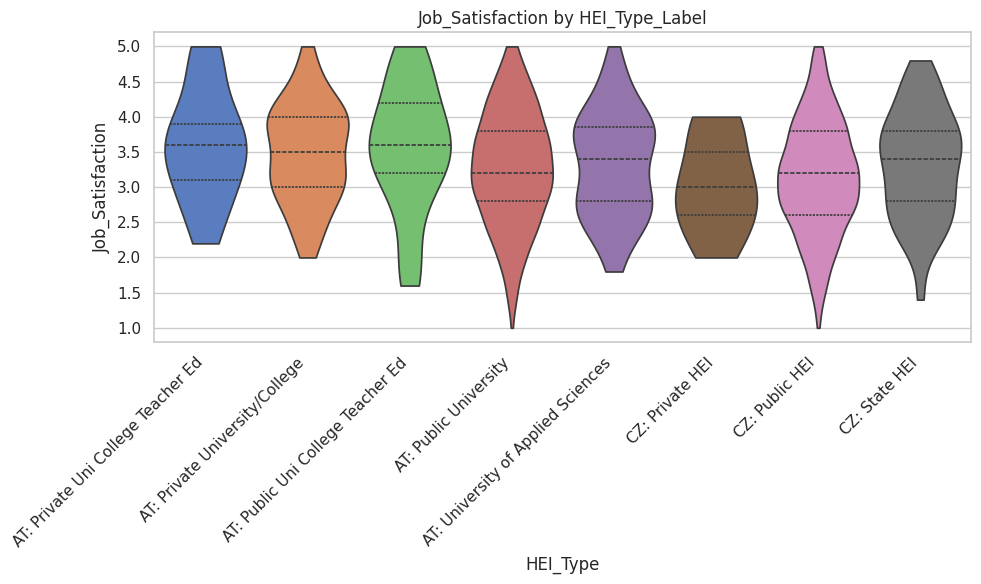

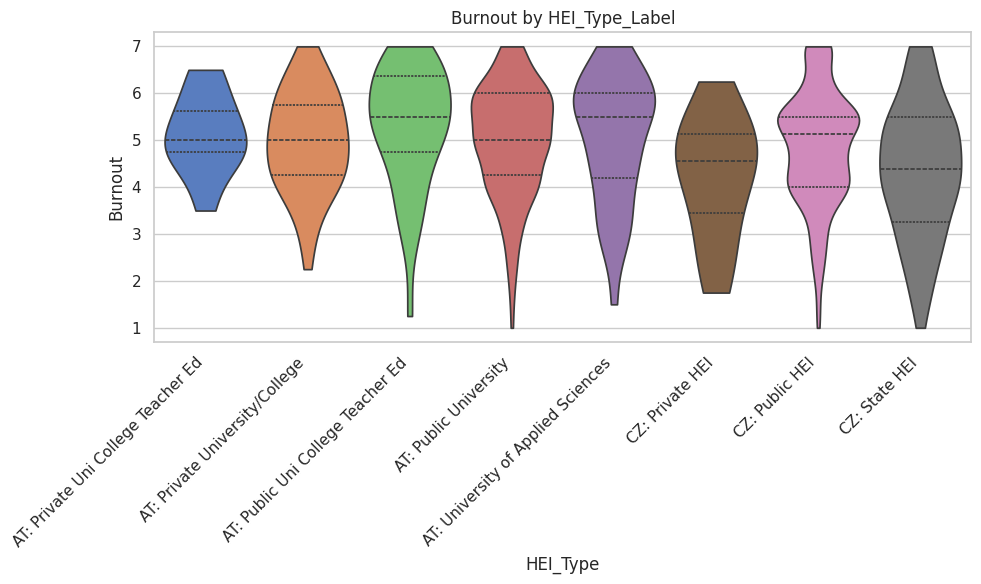

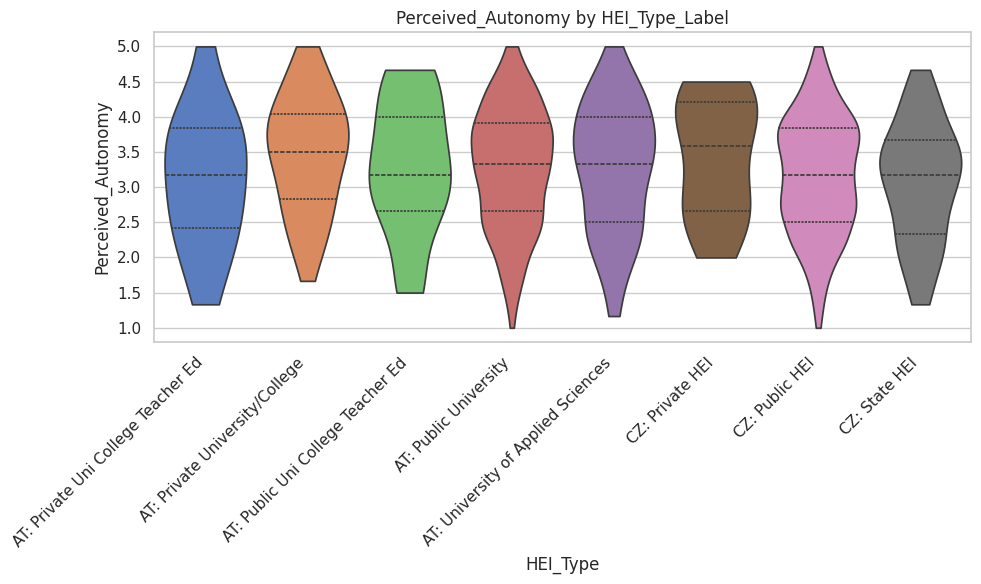

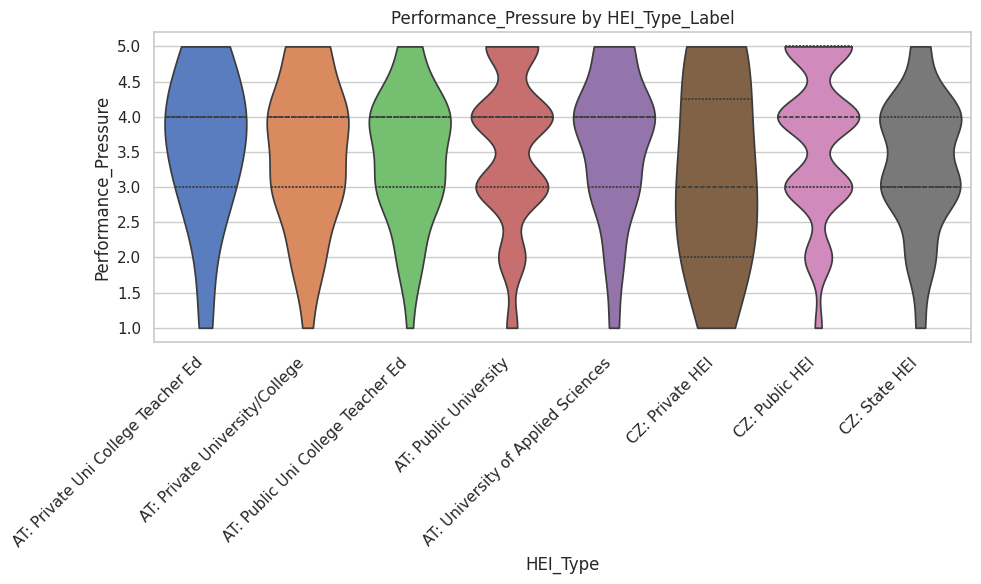

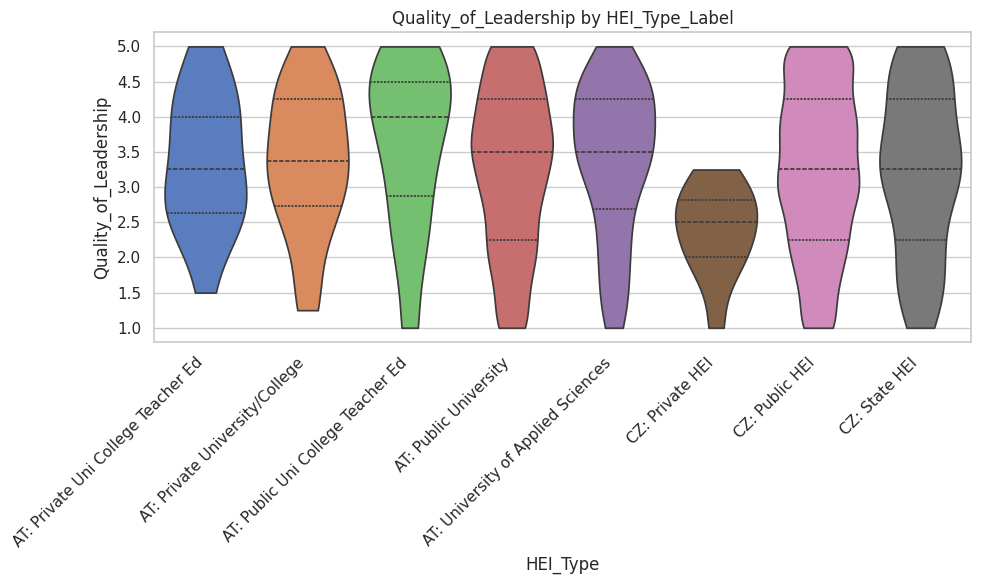

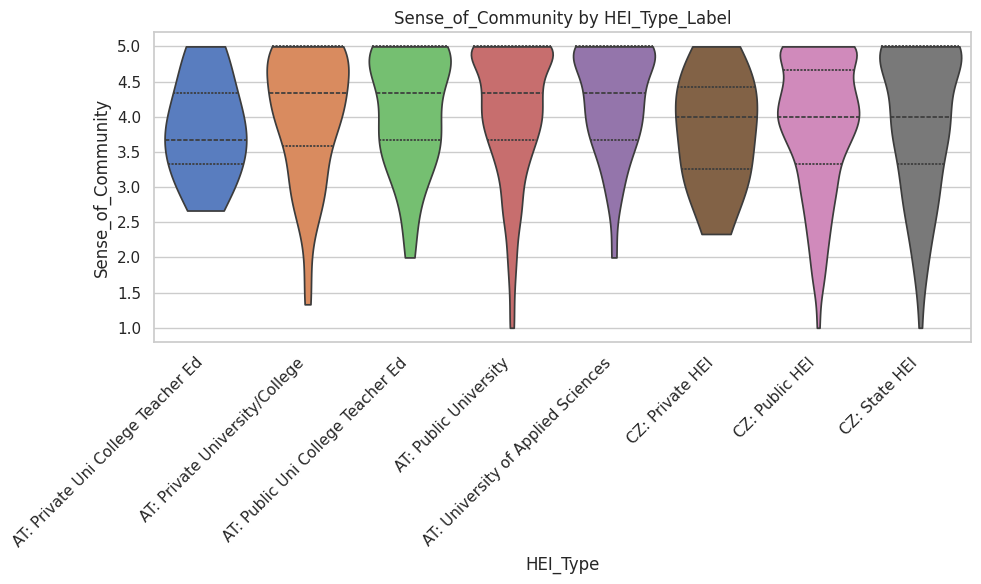

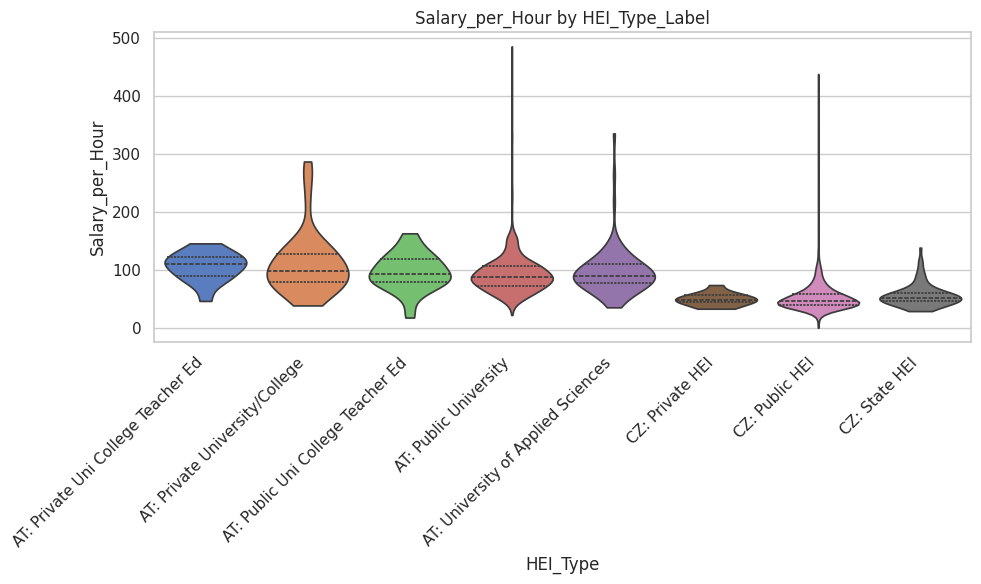

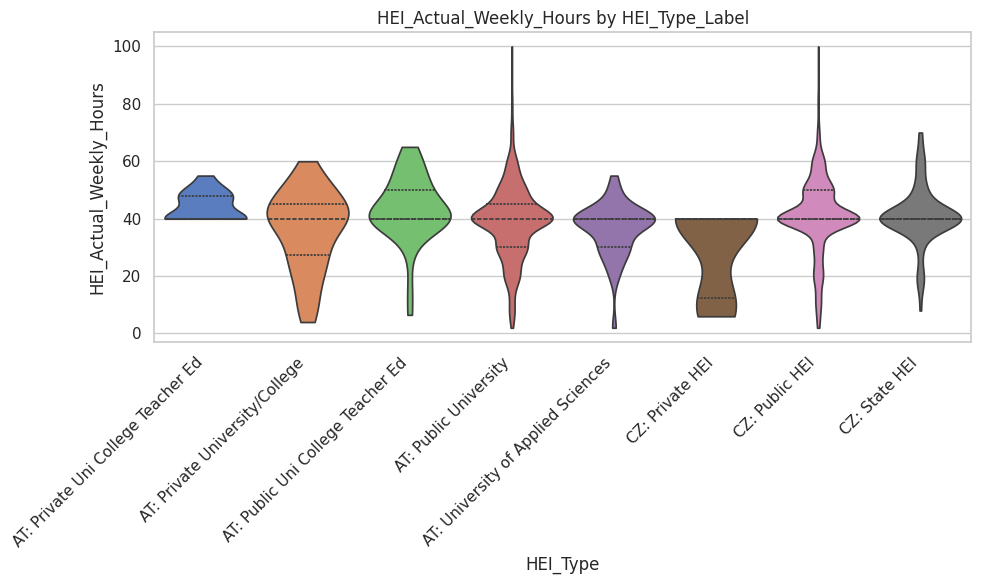

#### Grouped Analysis by: Faculty_Subject_Area_Label

Job_Satisfaction          Burnout          \
                                              mean median      mean  median   
Faculty_Subject_Area_Label                                                    
Agricultural/forestry/veterinary          3.165432    3.2  4.925926  5.1250   
Culture/art                               3.183060    3.2  4.986566  5.1250   
Economic sciences                         3.390769    3.2  4.706090  4.7500   
Healthcare/medical/pharmaceutical         3.197727    3.2  4.785354  4.8750   
Humanities/social sciences                3.157315    3.2  4.994378  5.1250   
Law                                       3.302222    3.4  4.727778  5.0000   
Natural sciences                          3.230069    3.2  4.800422  5.0000   
Other_Faculty                             3.444444    3.6  4.666667  4.7500   
Pedagogy/teacher training                 3.213372    3.2  4.935320  5.1250   
Security/defence/Military                 3.200000    3.4  4.923077  5.1250   
Sport sciences                            3.309091    3.3  4.965909  4.9375   
Technical sciences                        3.176483    3.2  4.909746  5.1250   
Unspecified/cannot be categorised         3.354412    3.4  4.648897  4.7500   

                                  Perceived_Autonomy            \
                                                mean    median   
Faculty_Subject_Area_Label                                       
Agricultural/forestry/veterinary            3.206996  3.333333   
Culture/art                                 3.338069  3.333333   
Economic sciences                           3.260256  3.166667   
Healthcare/medical/pharmaceutical           3.119865  3.166667   
Humanities/social sciences                  3.172117  3.166667   
Law                                         3.388889  3.500000   
Natural sciences                            3.256836  3.333333   
Other_Faculty                               3.203704  2.833333   
Pedagogy/teacher training                   3.219961  3.166667   
Security/defence/Military                   2.482051  2.333333   
Sport sciences                              3.416667  3.750000   
Technical sciences                          3.111441  3.166667   
Unspecified/cannot be categorised           3.241667  3.333333   

                                  Performance_Pressure         \
                                                  mean median   
Faculty_Subject_Area_Label                                      
Agricultural/forestry/veterinary              3.802469    4.0   
Culture/art                                   3.202186    3.0   
Economic sciences                             3.815385    4.0   
Healthcare/medical/pharmaceutical             3.636364    4.0   
Humanities/social sciences                    3.745267    4.0   
Law                                           3.688889    4.0   
Natural sciences                              3.694470    4.0   
Other_Faculty                                 4.000000    4.0   
Pedagogy/teacher training                     3.406977    3.0   
Security/defence/Military                     3.461538    4.0   
Sport sciences                                3.227273    3.0   
Technical sciences                            3.733051    4.0   
Unspecified/cannot be categorised             3.227941    3.0   

                                  Quality_of_Leadership         \
                                                   mean median   
Faculty_Subject_Area_Label                                       
Agricultural/forestry/veterinary               2.901235  3.000   
Culture/art                                    3.324681  3.500   
Economic sciences                              3.463462  3.500   
Healthcare/medical/pharmaceutical              3.093855  3.000   
Humanities/social sciences                     3.230063  3.250   
Law                                            3.222222  3.250   
Natural sciences                               3.270622  3.500   
Other_Facul

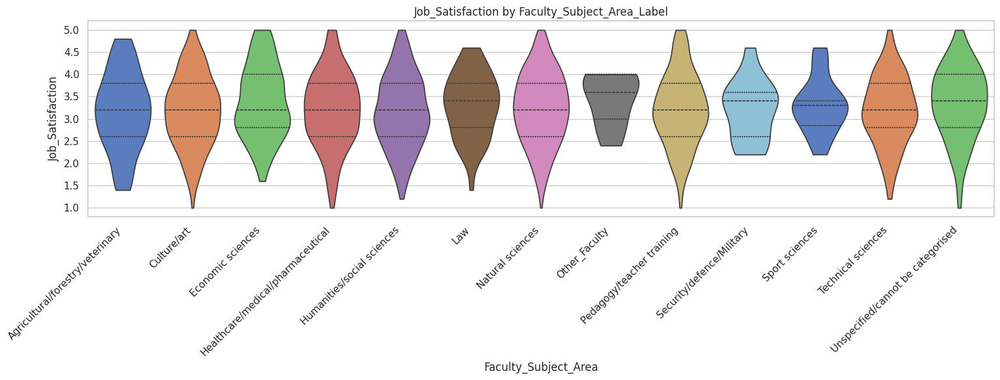

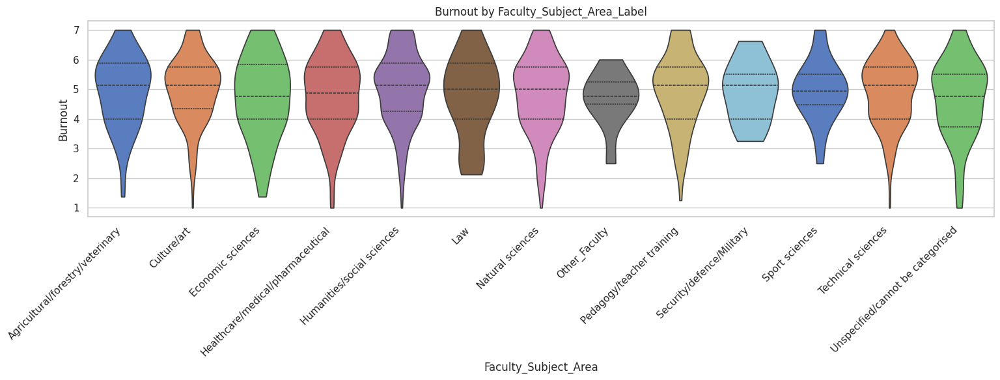

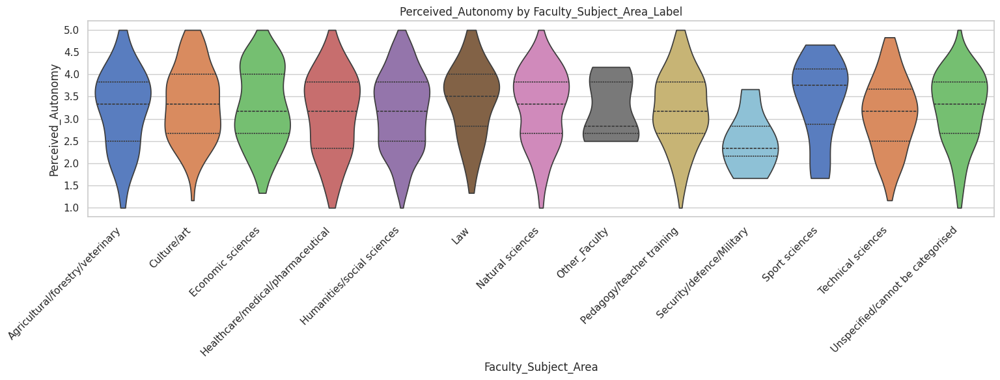

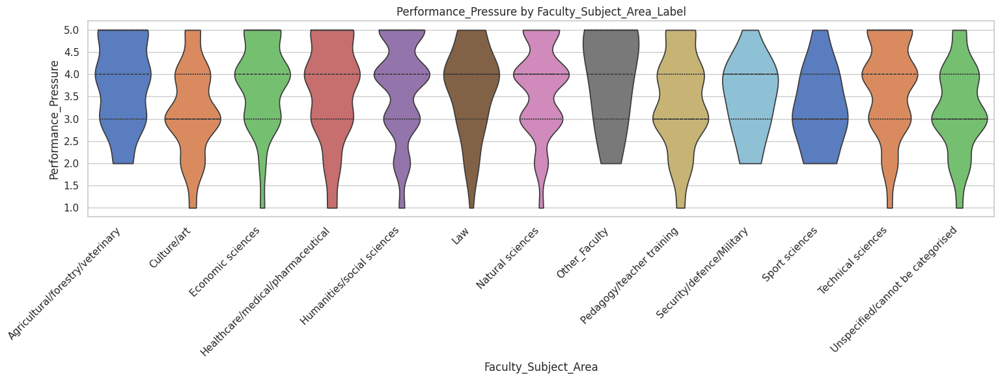

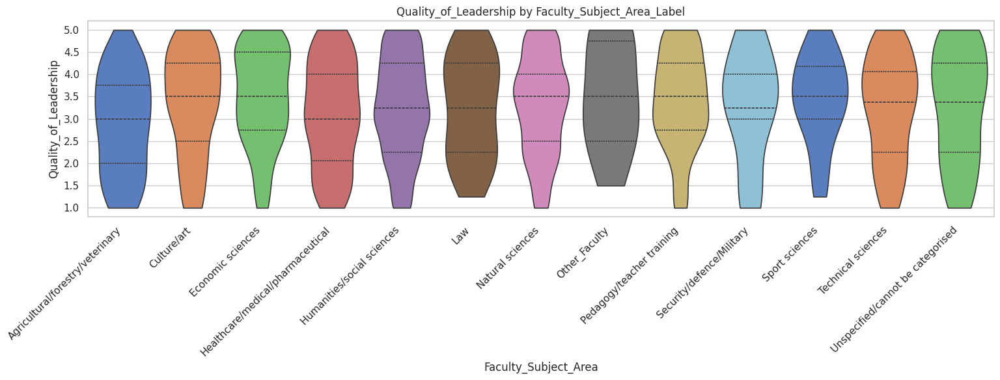

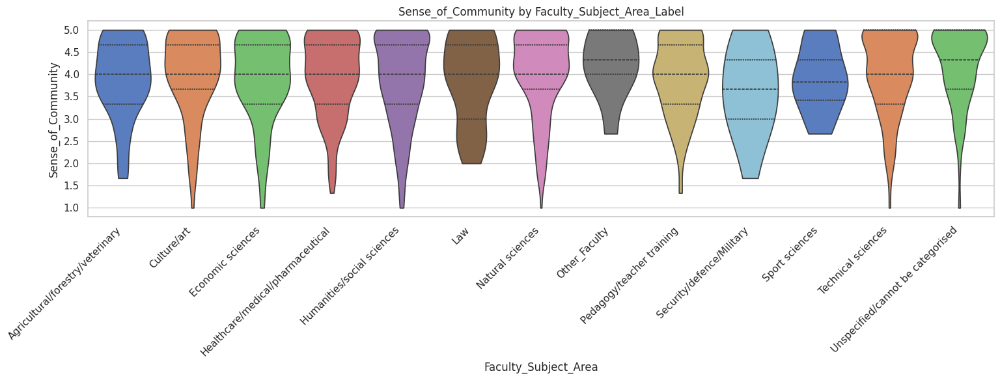

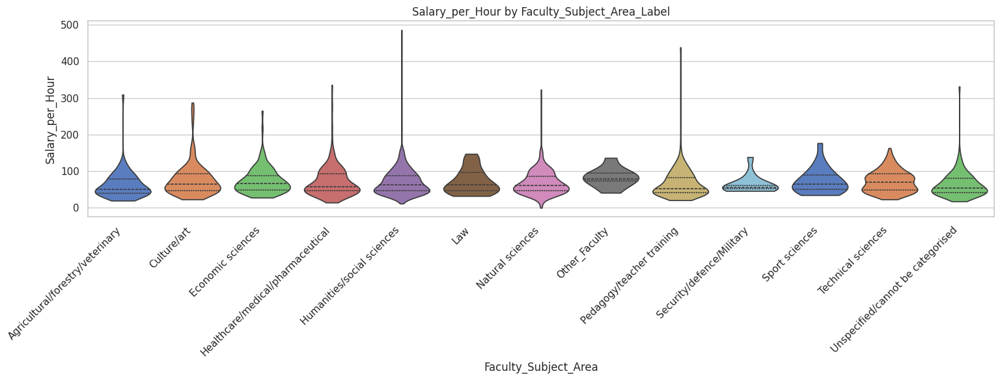

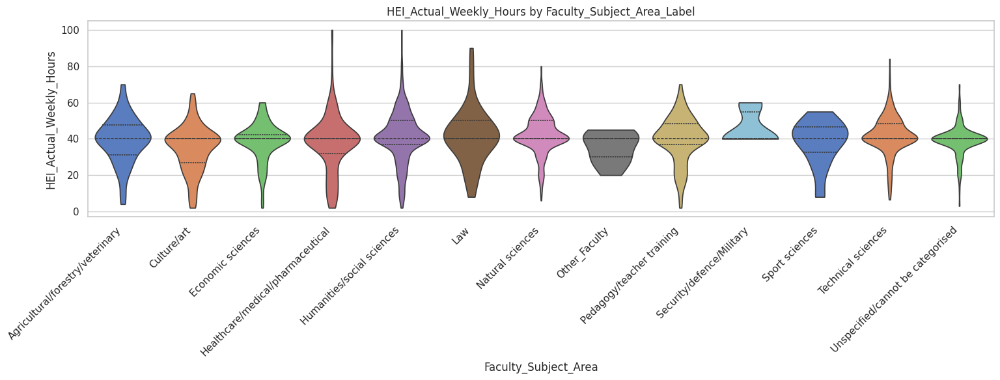

#### Grouped Analysis by: Age_Group

Job_Satisfaction          Burnout        Perceived_Autonomy  \
                      mean median      mean median               mean   
Age_Group                                                               
<30               3.259851    3.2  4.851301  5.000           3.286741   
30-39             3.146549    3.2  4.915141  5.125           3.215540   
40-49             3.154451    3.2  4.973377  5.125           3.079323   
50-59             3.292462    3.4  4.835427  5.000           3.274539   
60+               3.557292    3.6  4.365741  4.375           3.485880   

                    Performance_Pressure        Quality_of_Leadership         \
             median                 mean median                  mean median   
Age_Group                                                                      
<30        3.333333             3.572491    4.0              3.521871   3.75   
30-39      3.333333             3.611268    4.0              3.238944   3.25   
40-49      3.166667             3.633102    4.0              3.142119   3.25   
50-59      3.333333             3.636181    4.0              3.236893   3.25   
60+        3.666667             3.673611    4.0              3.381019   3.50   

          Sense_of_Community           Salary_per_Hour             \
                        mean    median            mean     median   
Age_Group                                                           
<30                 4.120818  4.333333       60.565348  57.698717   
30-39               3.938967  4.000000       67.935885  63.468589   
40-49               3.841446  4.000000       68.365714  57.698717   
50-59               3.976131  4.000000       80.634363  67.396918   
60+                 4.008102  4.000000       82.533328  64.045576   

          HEI_Actual_Weekly_Hours         
                             mean median  
Age_Group                                 
<30                     36.311710   40.0  
30-39                   40.267606   40.0  
40-49                   40.943185   40.0  
50-59                   41.195729   40.0  
60+                     38.311111   40.0

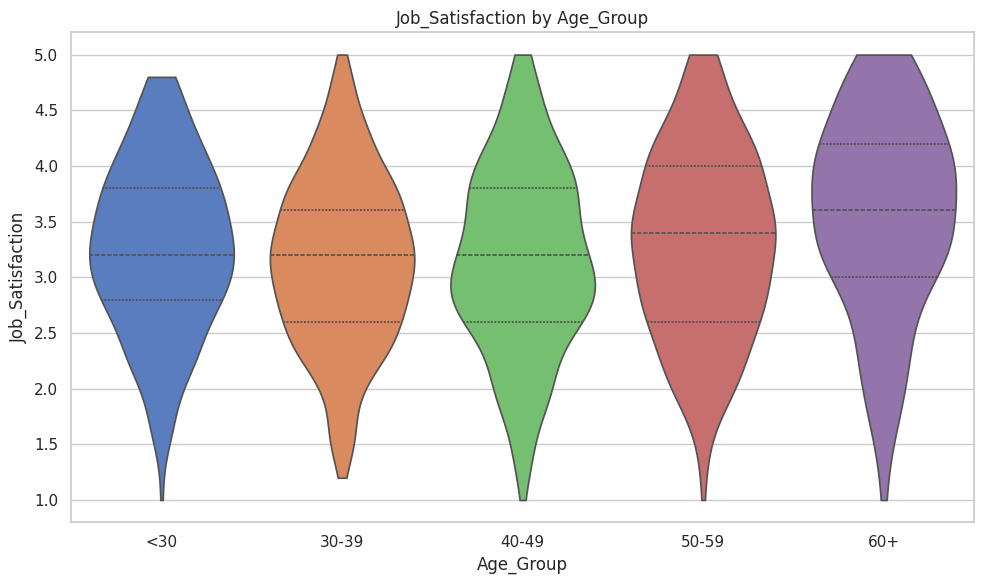

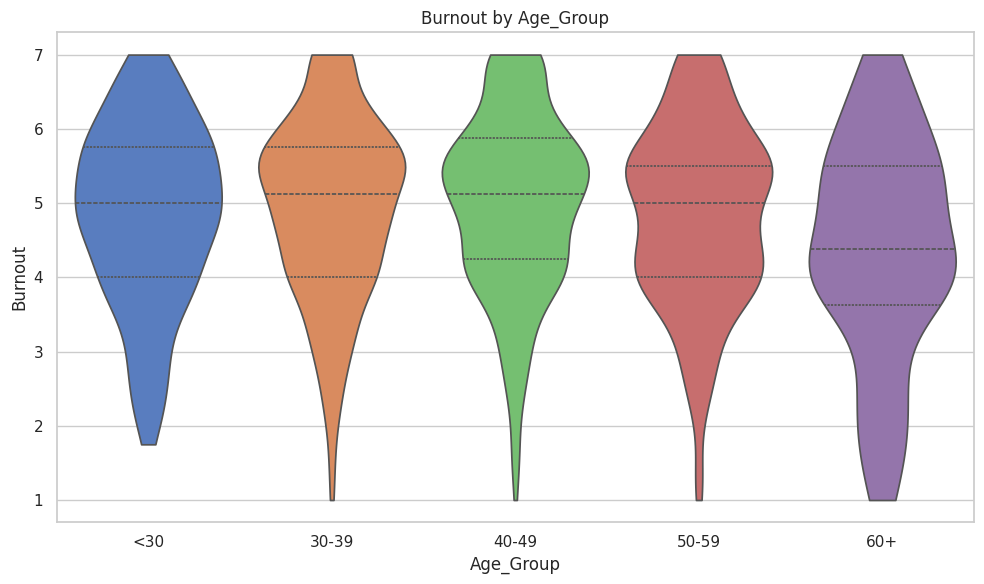

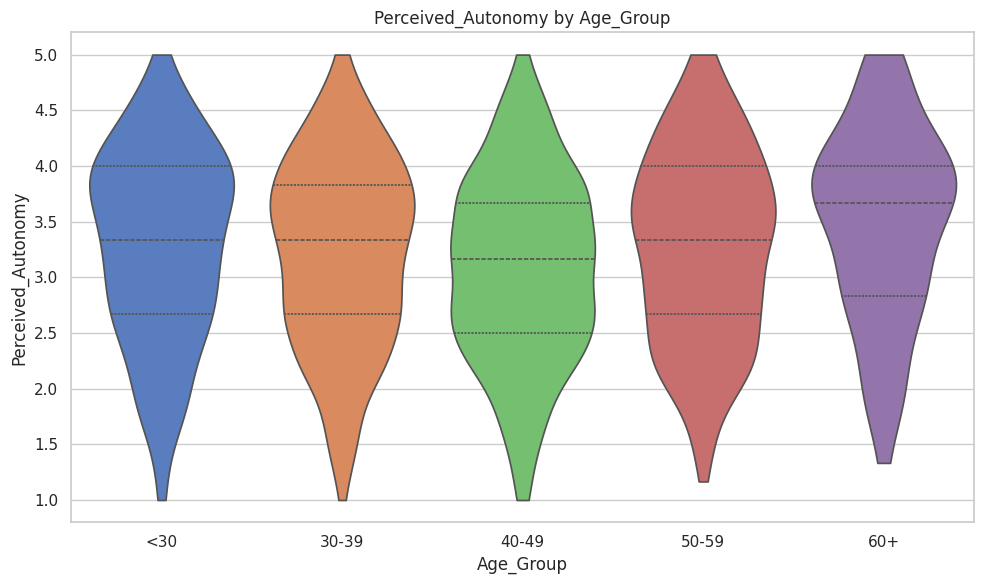

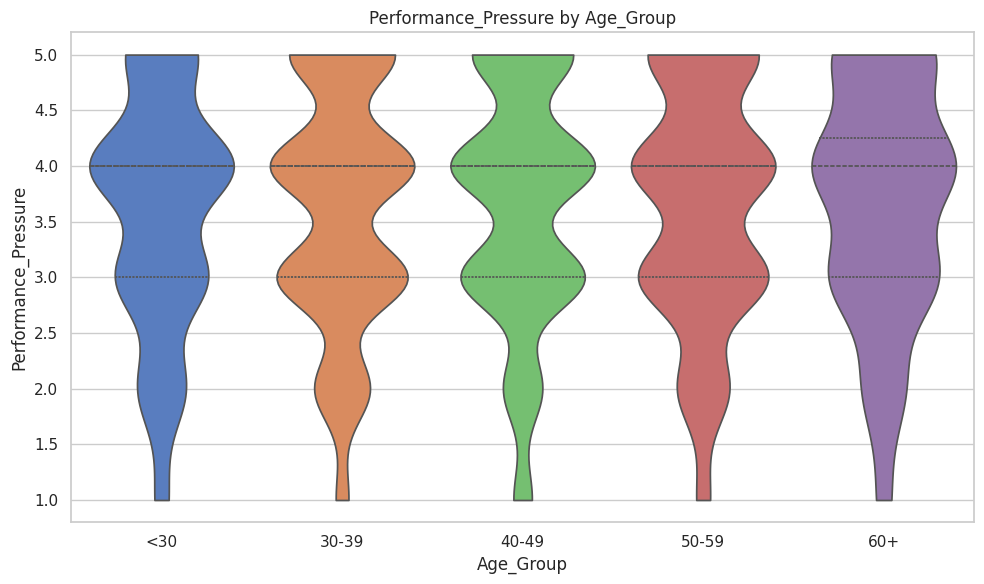

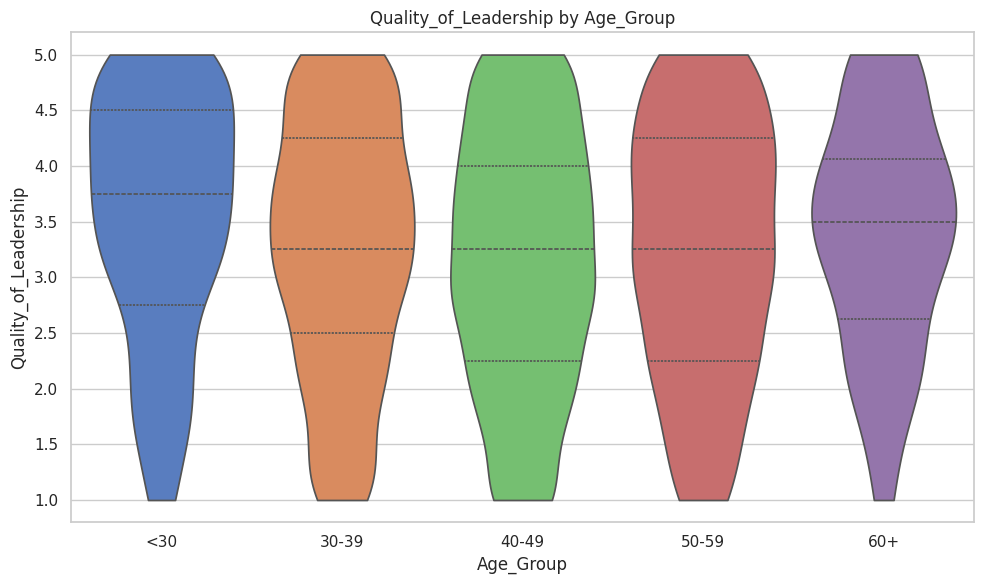

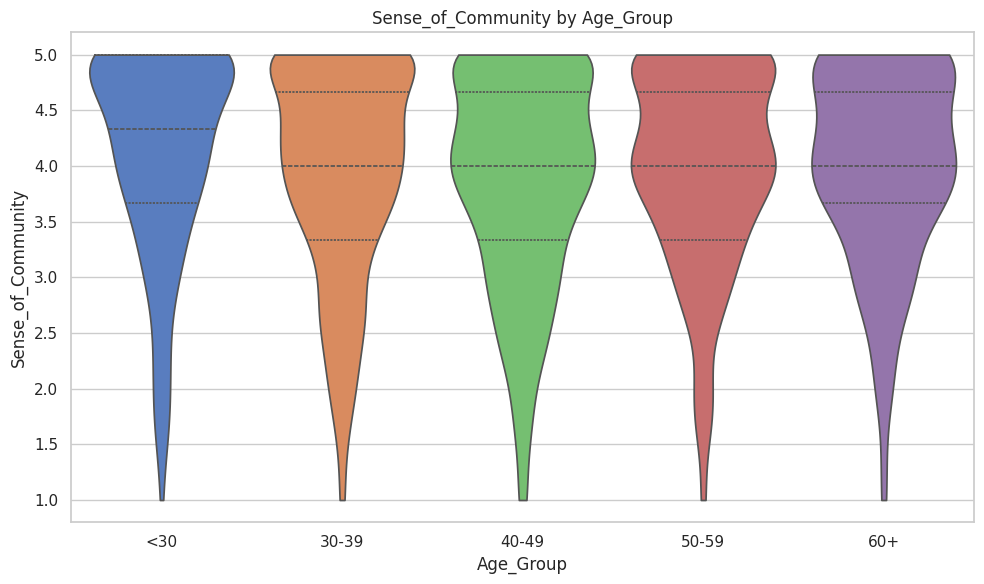

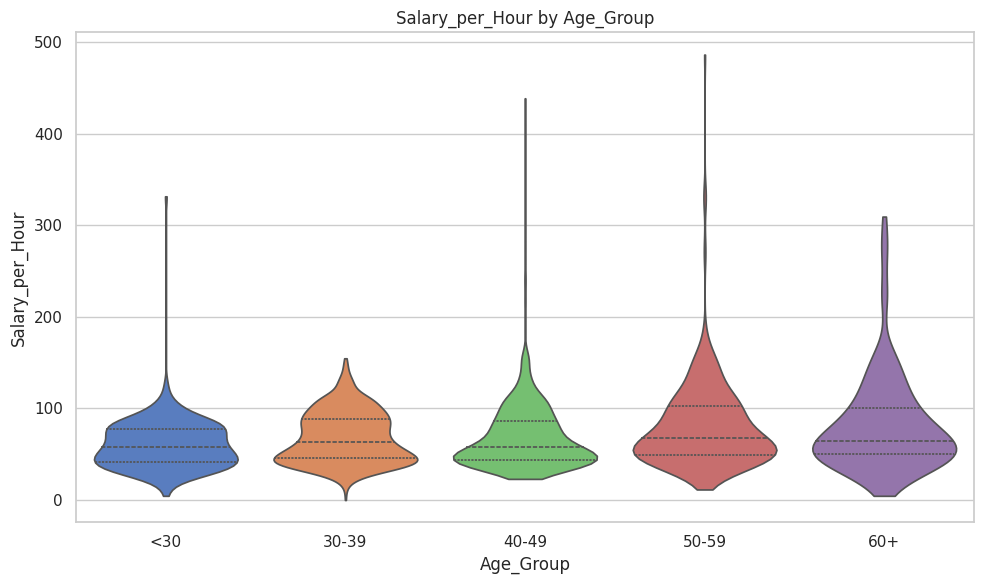

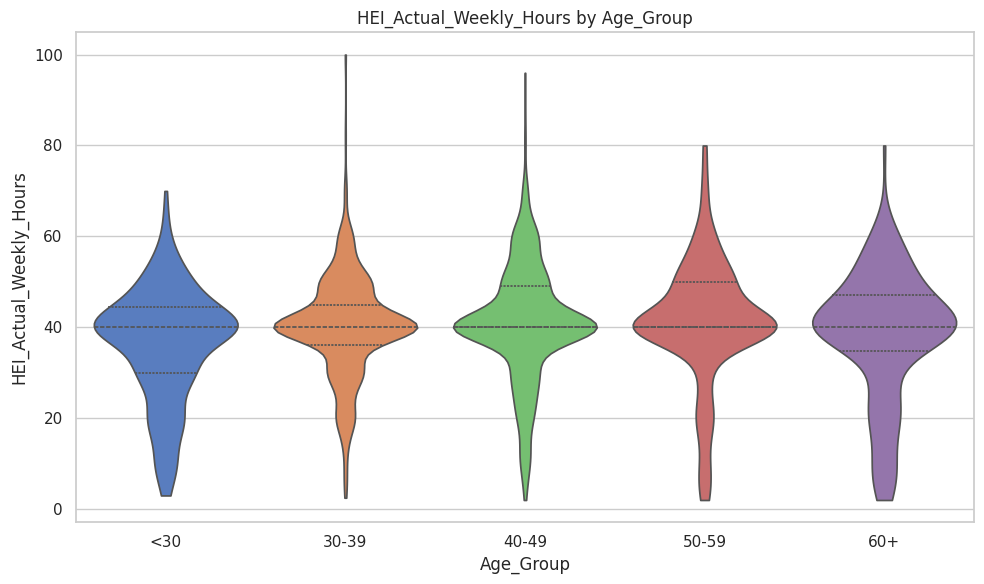

#### Grouped Analysis by: Employment_Contract_Duration_Label

Job_Satisfaction          Burnout         \
                                                mean median      mean median   
Employment_Contract_Duration_Label                                             
Casual/hourly                               3.148571    3.0  4.789286  5.125   
Fixed-term (no permanent prospects)         3.060180    3.0  4.836826  5.000   
Fixed-term (permanent prospects)            3.211987    3.2  4.927734  5.125   
Fixed-term (unspecified prospects)          2.909091    2.8  4.818182  5.125   
Other_Contract                              2.714286    3.0  5.553571  5.500   
Permanent (tenured AT)                      3.565789    3.6  4.726608  4.750   
Permanent/Continuous                        3.251893    3.2  4.866760  5.125   

                                    Perceived_Autonomy            \
                                                  mean    median   
Employment_Contract_Duration_Label                                 
Casual/hourly                                 3.533333  3.666667   
Fixed-term (no permanent prospects)           3.162275  3.166667   
Fixed-term (permanent prospects)              3.283070  3.333333   
Fixed-term (unspecified prospects)            3.242424  3.166667   
Other_Contract                                3.071429  3.333333   
Permanent (tenured AT)                        3.418129  3.500000   
Permanent/Continuous                          3.161015  3.166667   

                                    Performance_Pressure         \
                                                    mean median   
Employment_Contract_Duration_Label                                
Casual/hourly                                   3.400000    3.0   
Fixed-term (no permanent prospects)             3.721557    4.0   
Fixed-term (permanent prospects)                3.569401    4.0   
Fixed-term (unspecified prospects)              4.090909    4.0   
Other_Contract                                  3.142857    3.0   
Permanent (tenured AT)                          3.526316    4.0   
Permanent/Continuous                            3.632014    4.0   

                                    Quality_of_Leadership         \
                                                     mean median   
Employment_Contract_Duration_Label                                 
Casual/hourly                                    3.385714   3.50   
Fixed-term (no permanent prospects)              3.090070   3.25   
Fixed-term (permanent prospects)                 3.390116   3.50   
Fixed-term (unspecified prospects)               3.227273   3.75   
Other_Contract                                   3.142857   3.50   
Permanent (tenured AT)                           3.319591   3.50   
Permanent/Continuous                             3.214056   3.25   

                                    Sense_of_Community            \
                                                  mean    median   
Employment_Contract_Duration_Label                                 
Casual/hourly                                 3.485714  3.333333   
Fixed-term (no permanent prospects)           3.866267  4.000000   
Fixed-term (permanent prospects)              4.013670  4.333333   
Fixed-term (unspecified prospects)            4.212121  4.666667   
Other_Contract                                4.095238  4.000000   
Permanent (tenured AT)                        4.049708  4.333333   
Permanent/Continuous                          3.926850  4.000000   

                                    Salary_per_Hour              \
                                               mean      median   
Employment_Contract_Duration_Label                                
Casual/hourly                             84.683328   46.158974   
Fixed-term (no permanent prospects)       78.193384   79.560000   
Fixed-term (permanent prospects)          62.368516   51.928845   
Fixed-term (unspecified prospects)        56.033917   42.697050   
Other_Contract                            76.243508 

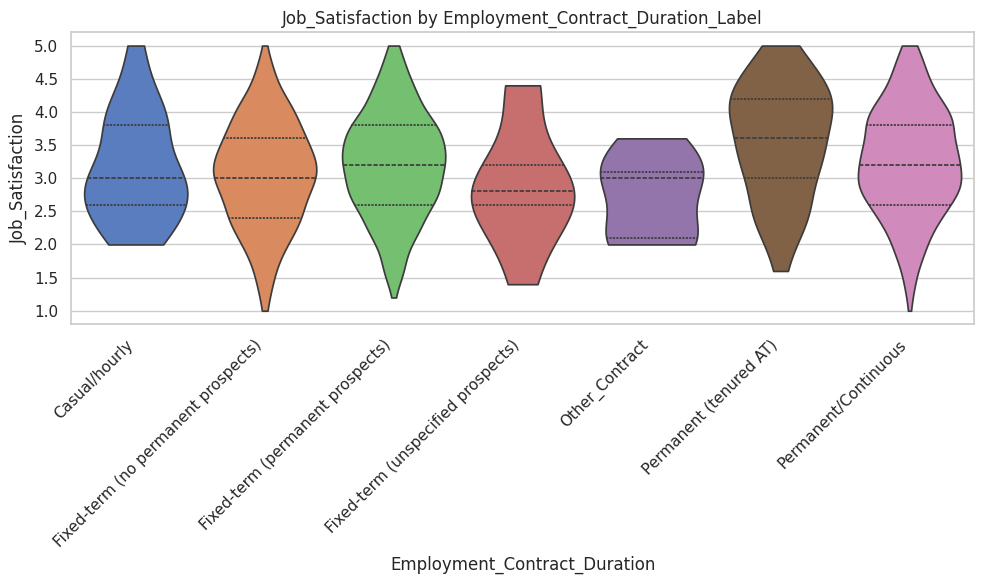

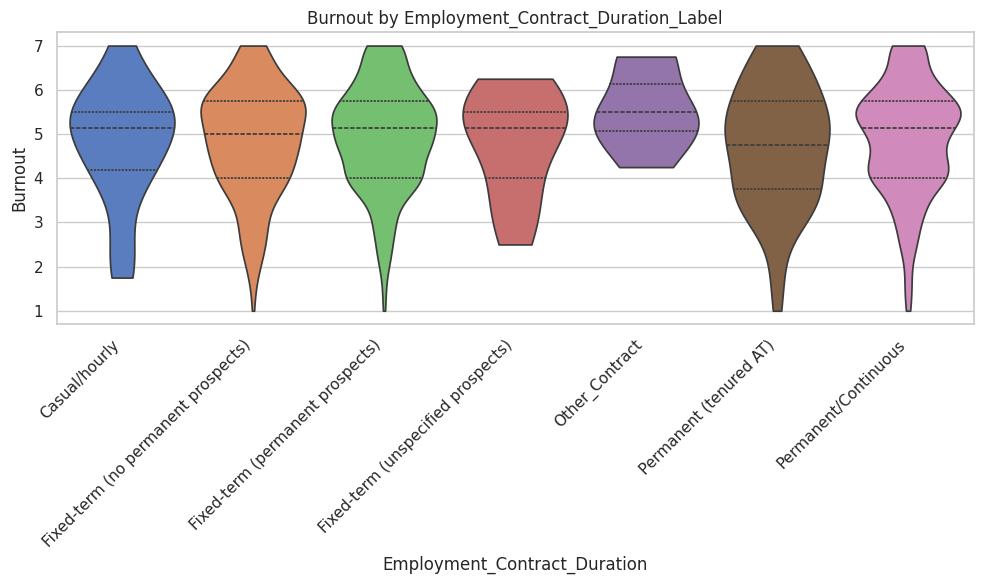

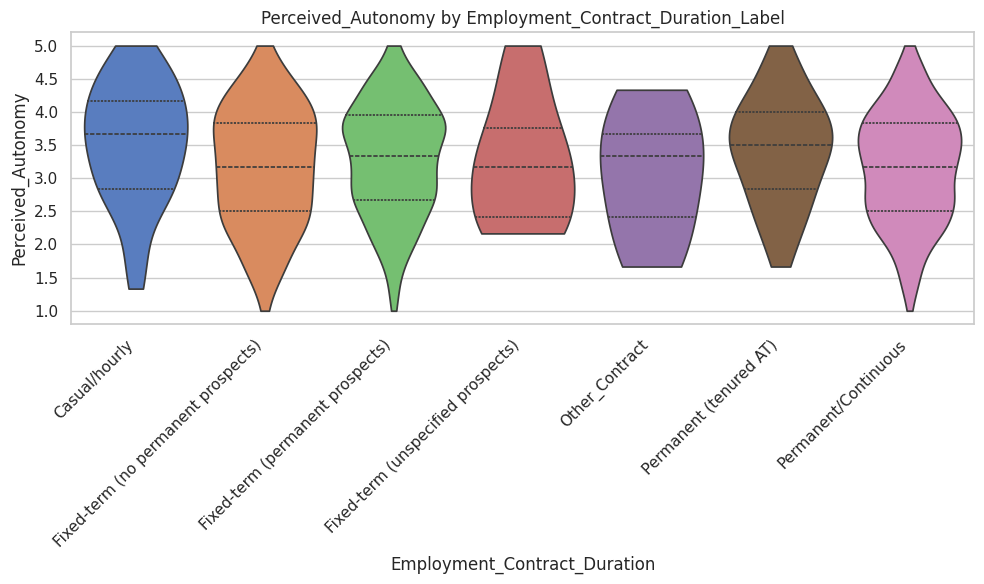

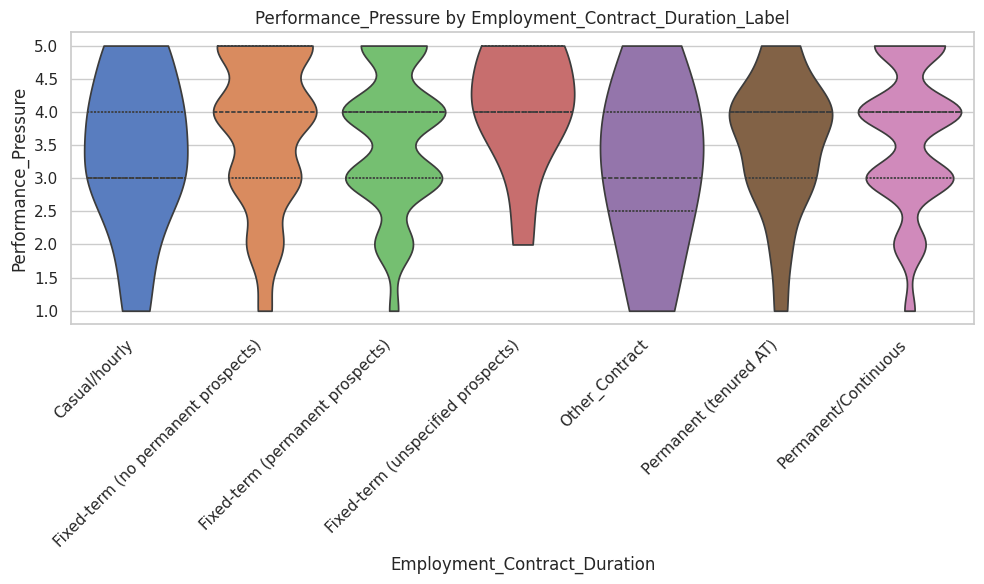

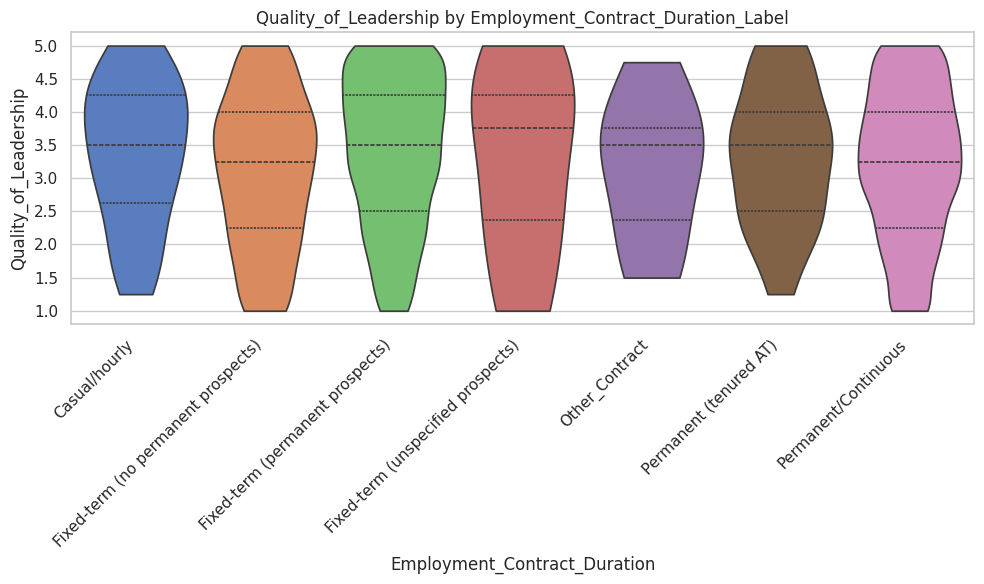

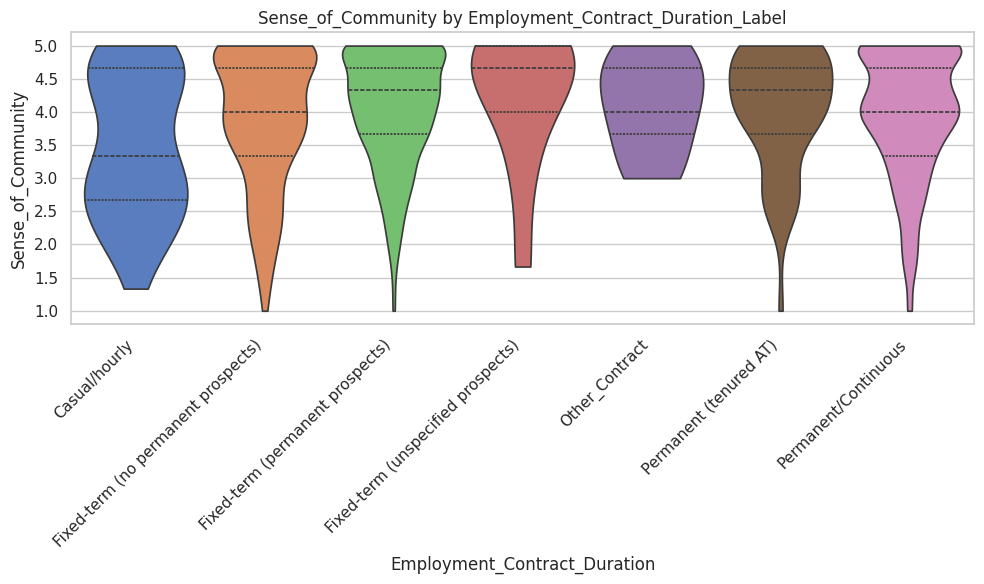

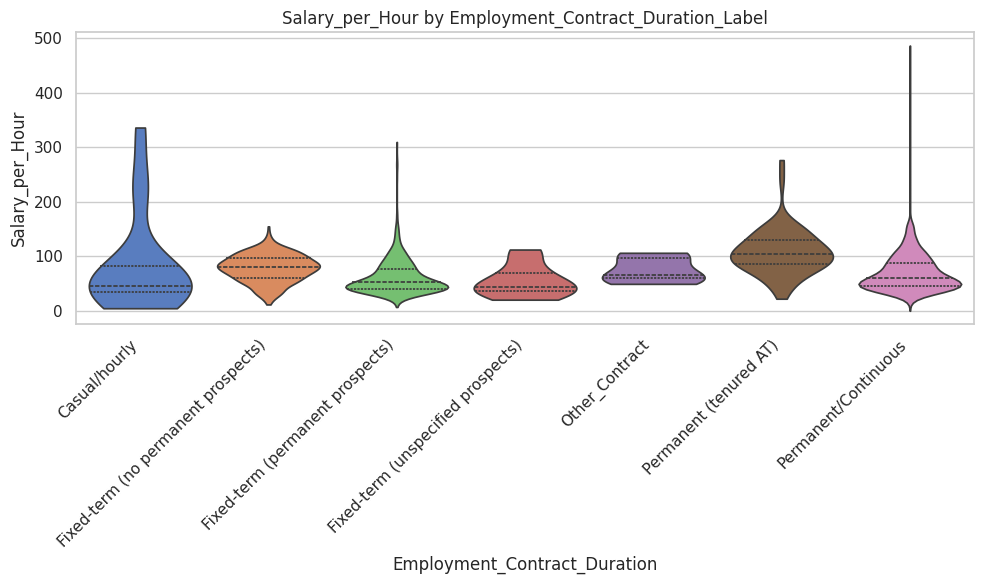

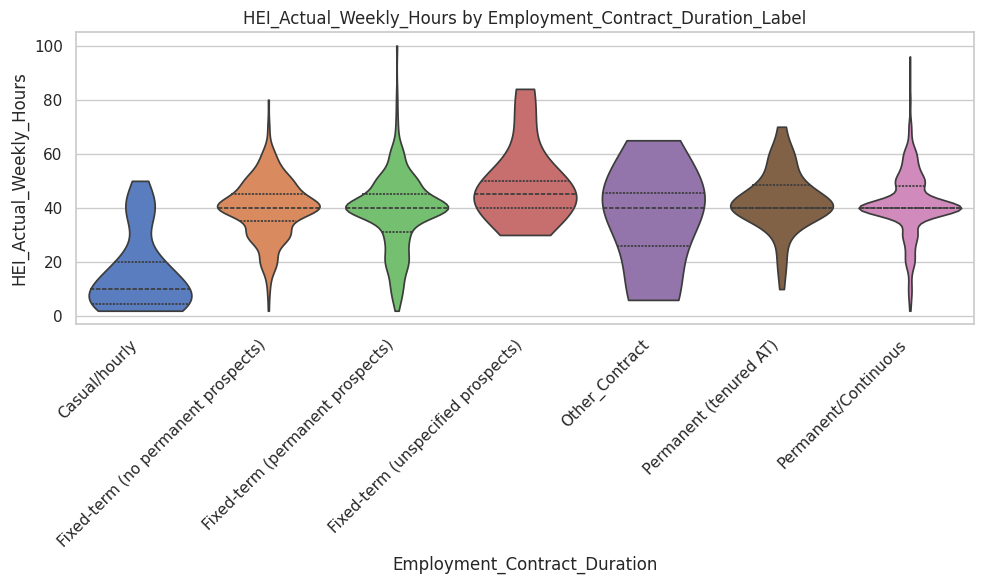

#### Grouped Analysis by: Leadership_Position_Label

Job_Satisfaction          Burnout         \
                                           mean median      mean median   
Leadership_Position_Label                                                 
Combination Leadership                 3.486066    3.4  5.135246  5.500   
No                                     3.153732    3.2  4.826067  5.000   
Yes (Institution/Faculty/Dept)         3.448539    3.4  4.971997  5.125   
Yes (Research Team)                    3.271300    3.4  5.048393  5.125   

                               Perceived_Autonomy            \
                                             mean    median   
Leadership_Position_Label                                     
Combination Leadership                   3.234973  3.333333   
No                                       3.206230  3.166667   
Yes (Institution/Faculty/Dept)           3.171753  3.333333   
Yes (Research Team)                      3.266069  3.333333   

                               Performance_Pressure         \
                                               mean median   
Leadership_Position_Label                                    
Combination Leadership                     3.918033    4.0   
No                                         3.565049    4.0   
Yes (Institution/Faculty/Dept)             3.685714    4.0   
Yes (Research Team)                        3.874439    4.0   

                               Quality_of_Leadership         \
                                                mean median   
Leadership_Position_Label                                     
Combination Leadership                      3.367486   3.50   
No                                          3.270591   3.25   
Yes (Institution/Faculty/Dept)              3.256818   3.50   
Yes (Research Team)                         3.062407   3.00   

                               Sense_of_Community           Salary_per_Hour  \
                                             mean    median            mean   
Leadership_Position_Label                                                     
Combination Leadership                   4.125683  4.333333       89.210483   
No                                       3.924960  4.000000       66.143994   
Yes (Institution/Faculty/Dept)           4.045455  4.333333       80.300433   
Yes (Research Team)                      3.860239  4.000000       82.865944   

                                          HEI_Actual_Weekly_Hours         
                                   median                    mean median  
Leadership_Position_Label                                                 
Combination Leadership          83.980000               46.495082   45.0  
No                              57.698717               38.104703   40.0  
Yes (Institution/Faculty/Dept)  71.248602               45.358929   40.0  
Yes (Research Team)             81.770000               45.315695   44.0

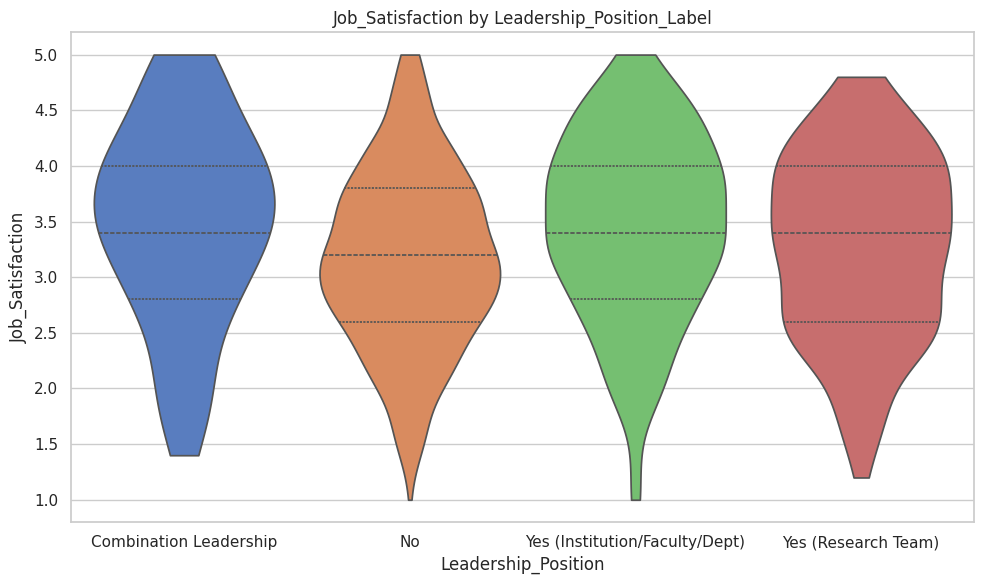

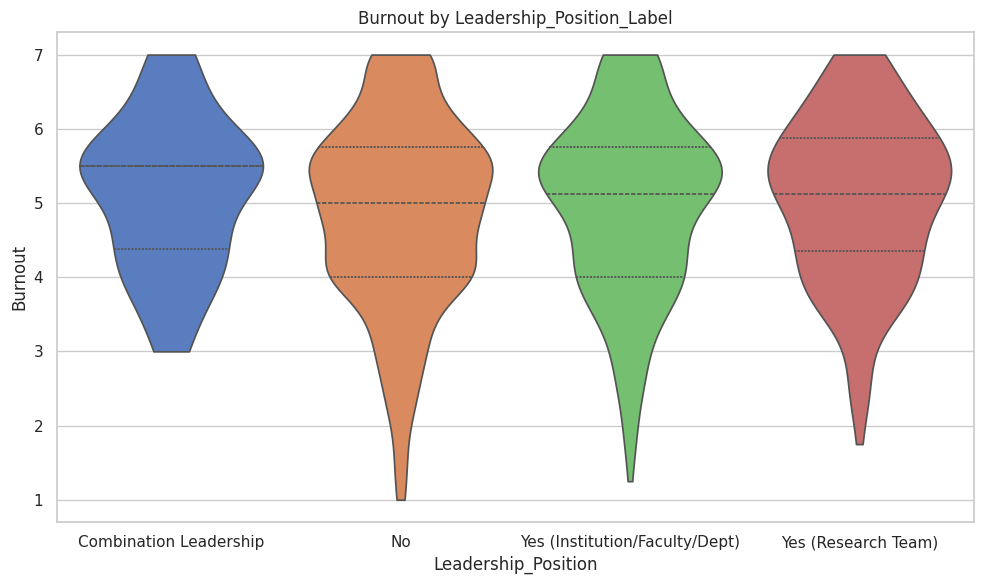

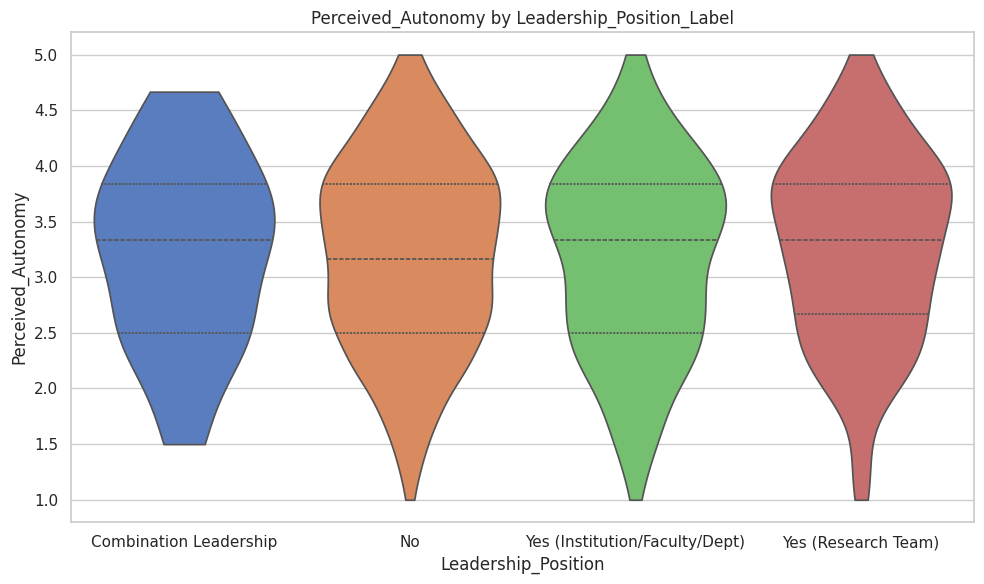

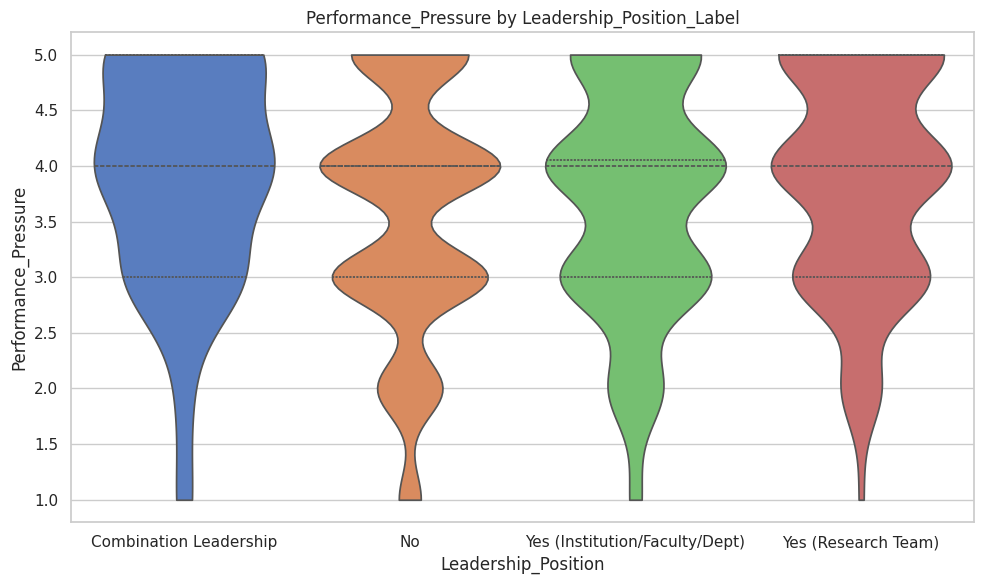

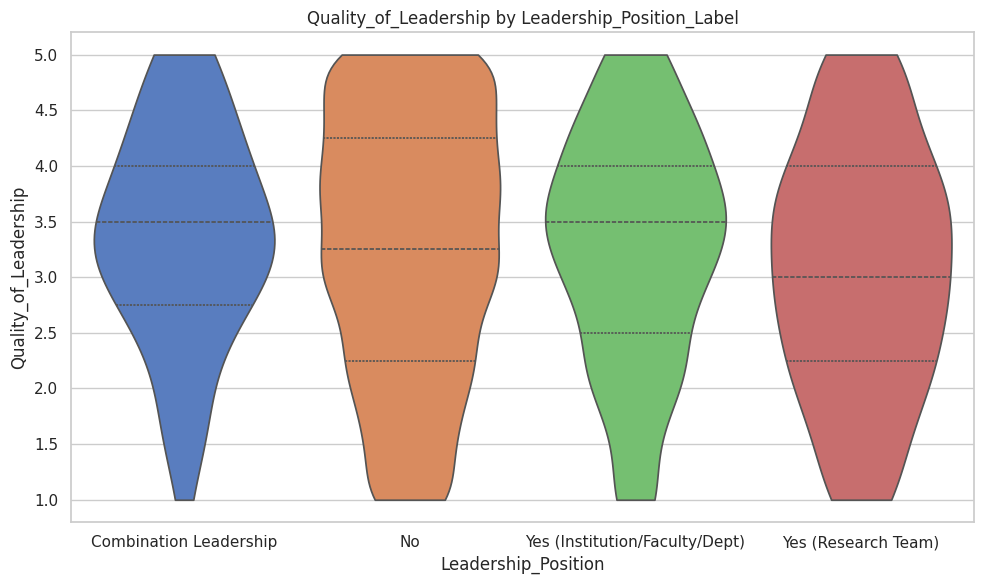

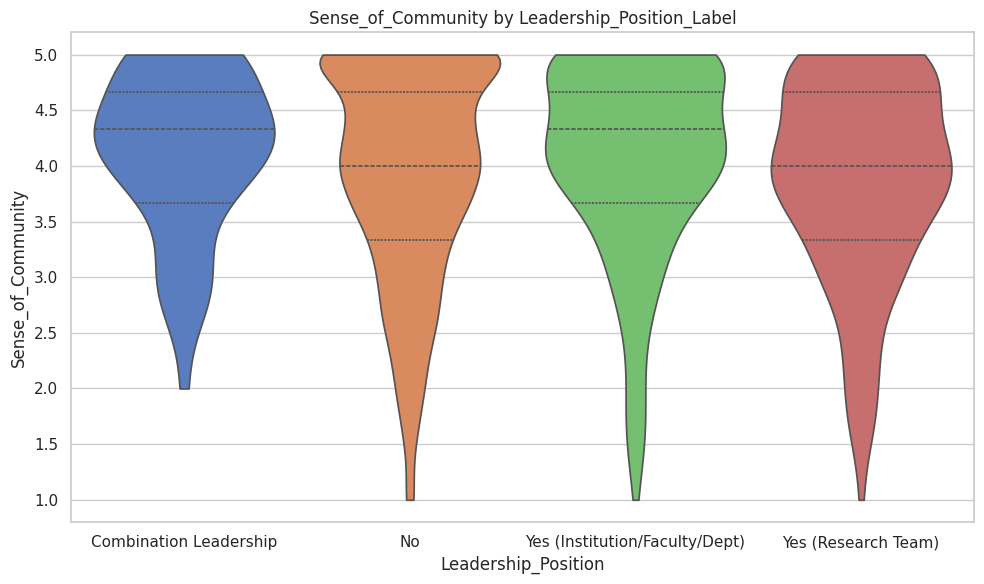

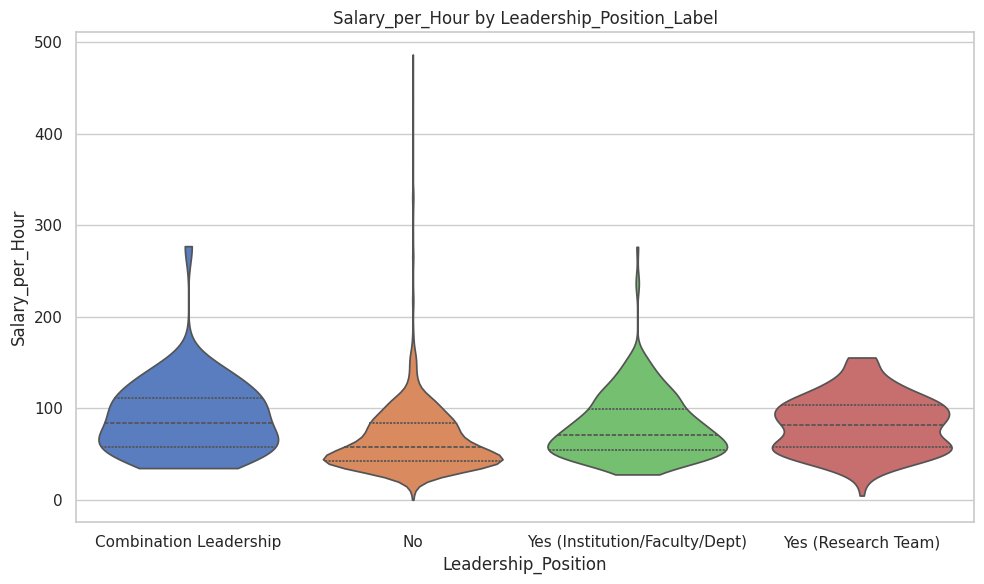

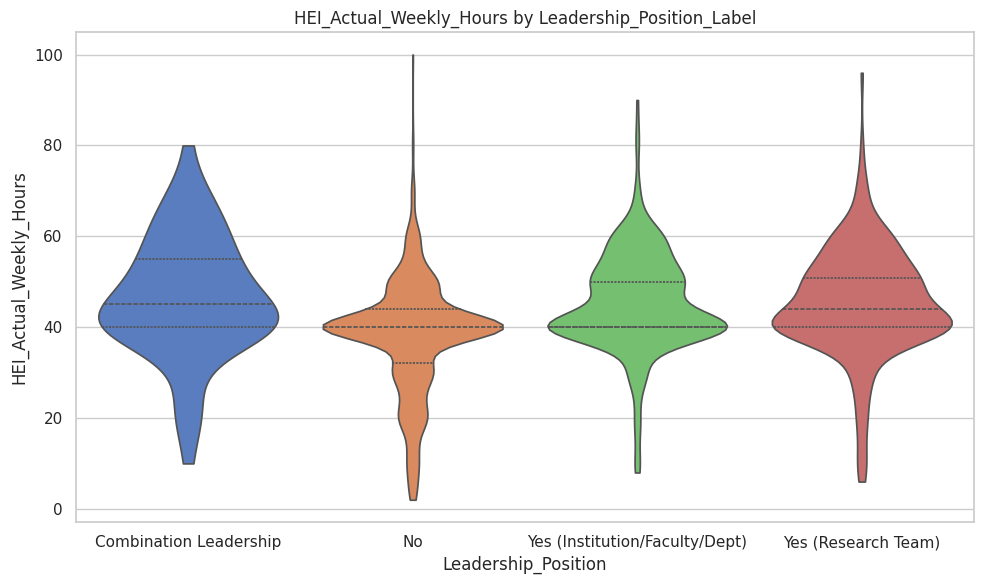

In [43]:
# Check if df_cleaned exists and is not empty, and if Age_Group was created
if 'df_cleaned' in locals() and not df_cleaned.empty and 'Age_Group' in df_cleaned.columns:
    # --- Grouping Variables and Target Variables ---
    # Use the labeled categorical columns + Age_Group
    grouping_vars_labels = ['Country_Label', 'Gender_Label', 'HEI_Type_Label',
                            'Faculty_Subject_Area_Label', 'Age_Group',
                            'Employment_Contract_Duration_Label', 'Leadership_Position_Label']

    # Select key well-being variables (ensure they exist and are numeric)
    target_vars = [
        'Job_Satisfaction', 'Burnout', 'Perceived_Autonomy',
        'Performance_Pressure', 'Quality_of_Leadership', 'Sense_of_Community',
        'Salary_per_Hour', 'HEI_Actual_Weekly_Hours'
    ]

    # Filter target_vars to ensure they exist in df_cleaned and are numeric
    valid_target_vars = [var for var in target_vars if var in df_cleaned.columns and pd.api.types.is_numeric_dtype(df_cleaned[var])]
    print(f"Well-being variables to analyze: {valid_target_vars}")

    # --- Generate Grouped Statistics and Plots ---
    for group_var in grouping_vars_labels:
        if group_var in df_cleaned.columns:
            # Check if the grouping variable has non-missing values
            if df_cleaned[group_var].notna().any():
                display(Markdown(f"#### Grouped Analysis by: {group_var}"))

                # Calculate grouped descriptive statistics (mean and median)
                try:
                    # Use observed=False for category dtype if needed (Pandas >= 1.5)
                    if pd.__version__ >= '1.5.0':
                         grouped_stats = df_cleaned.groupby(group_var, observed=False)[valid_target_vars].agg(['mean', 'median'])
                    else:
                         grouped_stats = df_cleaned.groupby(group_var)[valid_target_vars].agg(['mean', 'median'])
                    display(grouped_stats)
                except Exception as e:
                     print(f"Could not calculate grouped stats for {group_var}. Error: {e}")
                     continue # Skip plotting if stats failed

                # Generate comparative plots (Boxplots or Violinplots)
                for target_var in valid_target_vars:
                    # Determine appropriate figure size based on number of categories
                    num_categories = df_cleaned[group_var].nunique()
                    fig_height = 6
                    fig_width = max(10, num_categories * 1.2) # Adjust width based on categories
                    plt.figure(figsize=(fig_width, fig_height))

                    try:
                        # Use violinplot to show distribution plus comparison
                        sns.violinplot(x=group_var, y=target_var, data=df_cleaned, palette='muted', cut=0, inner='quartile',
                                       order=grouped_stats.index) # Ensure order matches stats table
                        # Alternative: sns.boxplot(x=group_var, y=target_var, data=df_cleaned, palette='muted', order=grouped_stats.index)

                        plt.title(f'{target_var} by {group_var}')
                        plt.xlabel(group_var.replace('_Label', '')) # Cleaner axis label
                        plt.ylabel(target_var)
                        # Rotate X-axis labels if there are many or they are long
                        if num_categories > 5:
                            plt.xticks(rotation=45, ha='right')
                        else:
                            plt.xticks(rotation=0)
                        plt.tight_layout()
                        plt.show()
                    except Exception as e:
                         print(f"Could not plot {target_var} by {group_var}. Error: {e}")
                         if plt.gcf().get_axes(): # Close the potentially empty figure
                             plt.close()
            else:
                print(f"Skipping grouped analysis for '{group_var}' as it contains only missing values.")
        else:
             print(f"Warning: Grouping variable '{group_var}' not found in the DataFrame.")

else:
    print("Empty DataFrame or 'Age_Group' not created, grouped analysis skipped.")

## 6. Preliminary EDA Conclusions and Next Steps

The exploratory analysis has provided a detailed view of the dataset's characteristics and revealed initial patterns and potential disparities in labour well-being.

**Key Observations:**
* The distributions of numerical and categorical variables have been identified.
* The correlation analysis shows some linear relationships between numerical variables but also indicates the need for more complex models to capture non-linear relationships.
* Bivariate plots and grouped analysis have begun to highlight differences in well-being perceptions based on country, gender, age, institution type, contract type, and field of study. These differences warrant deeper investigation through statistical tests (e.g., t-tests, ANOVA) and multivariate modeling.
* The scaling of the `Burnout` variable allows for direct comparison between Austria and the Czech Republic on this metric.

**Next Steps:**
1.  **Inferential Statistical Analysis:** Perform hypothesis tests to confirm if the differences observed in the grouped analysis are statistically significant.
2.  **Feature Selection:** Based on the EDA and domain knowledge, select the most relevant predictor and outcome variables for modeling.
3.  **Modeling:** Develop models (e.g., multiple linear regression, logistic/ordinal regression, structural equation modeling) to identify the key determinants of labour well-being, controlling for multiple factors.
4.  **Encoding for Models:** For modeling, the categorical variables with text labels will need to be numerically encoded (e.g., one-hot encoding, dummy variables).
5.  **Scaling:** Numerical variables may need to be scaled (e.g., standardization) before applying certain modeling algorithms.